# Double Pendulum Synchronization

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import integrate
from matplotlib import rc

In [2]:
def double_pendulum_computations(z, time, L1_1, L2_1, L1_2, L2_2, m1_1, m2_1, 
                    m1_2, m2_2, g, coupling_strength_K, number_of_pendulums):
    pendulum_values = []; return_values = []; pendulum_values.extend(z)
    for oscillator_i in range(0, number_of_pendulums):
        error = 0
        for oscillator_j in range(0, number_of_pendulums):
            if oscillator_i != oscillator_j:
                error += np.sin(pendulum_values[oscillator_j * 4]
                    - pendulum_values[oscillator_i * 4])
        pendulum_values[oscillator_i * 4 + 1] += ((coupling_strength_K * error) / 
                                                  number_of_pendulums)
    for oscillator_i in range(0, number_of_pendulums):
        L1 = L1_1 if oscillator_i == 0 else L1_2; L2 = L2_1 if oscillator_i == 0 else L2_2
        m1 = m1_1 if oscillator_i == 0 else m1_2; m2 = m2_1 if oscillator_i == 0 else m2_2
        theta1, w1, theta2, w2 = pendulum_values[oscillator_i * 4 : oscillator_i * 4 + 4]
        xi = np.cos(theta1 - theta2) ** 2 * m2 - m1 - m2
        w1dot = (L1 * m2 * np.cos(theta1 - theta2) * np.sin(theta1 - theta2) * w1**2
            + L2 * m2 * np.sin(theta1 - theta2) * w2**2
            - m2 * g * np.cos(theta1 - theta2) * np.sin(theta2)
            + (m1 + m2) * g * np.sin(theta1)) / (L1 * xi)
        w2dot = -(L2 * m2 * np.cos(theta1 - theta2) * np.sin(theta1 - theta2) * w2**2
            + L1 * (m1 + m2) * np.sin(theta1 - theta2) * w1**2
            + (m1 + m2) * g * np.sin(theta1) * np.cos(theta1 - theta2)
            - (m1 + m2) * g * np.sin(theta2)) / (L2 * xi)
        return_values.extend([w1, w1dot, w2, w2dot])
    return return_values


def to_cartesian(theta1, w1, theta2, w2, L1, L2):
    x1 = L1 * np.sin(theta1)
    y1 = -L1 * np.cos(theta1)
    x2 = x1 + L2 * np.sin(theta2)
    y2 = y1 - L2 * np.cos(theta2)
    vx1 = L1 * np.cos(theta1) * w1
    vy1 = L1 * np.sin(theta1) * w1
    vx2 = vx1 + L2 * np.cos(theta2) * w2
    vy2 = vy1 + L2 * np.sin(theta2) * w2
    return x1, y1, x2, y2, vx1, vy1, vx2, vy2

In [3]:
def plot_position(x1, y1, x2, y2, theta1, theta2, w1, w2, t):
    plt.figure(figsize=(8 * figsize, 2 * figsize), dpi=dpi)
    L1 = max(L1_1, L1_2)
    L2 = max(L2_1, L2_2)
    # xy-plot
    L = 1.1 * (L1 + L2)
    ax = plt.subplot(2, 2, (1, 3), autoscale_on=False, xlim=(-1.5*L, 1.5*L), ylim=(-1.5*L, 1.5*L))
    ax.plot(x1, y1, label=r"Track $m_1$")
    ax.plot(x2, y2, label=r"Track $m_2$")
    ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c="k")
    plt.ylabel(r"$y/L$")
    plt.xlabel(r"$x/L$")
    plt.title(r"Time Series Analysis, $\theta_{10}=%.1f$, $\theta_{20}=%.1f$ "
        % (theta1[0], theta2[0])
        + r"$\omega_{10}=%.1f$, $\omega_{20}=%.1f$" % (w1[0], w2[0]),
        fontweight="bold")
    ax.legend()

    # xt-plot
    ax = plt.subplot(2, 2, 2)
    ax.plot(t, theta1, label=r"$\theta_1(t)$")
    ax.plot(t, theta2, label=r"$\theta_2(t)$")
    plt.ylabel(r"$\theta$, [rad]")
    plt.xlabel(r"$t$, [s]")
    plt.title(r"Time Series Analysis, $\theta_{10}=%.1f$, $\theta_{20}=%.1f$ "
        % (theta1[0], theta2[0])
        + r"$\omega_{10}=%.1f$, $\omega_{20}=%.1f$" % (w1[0], w2[0]),
        fontweight="bold")
    ax.legend()
    plt.xlim([0, np.max(t)])

    # yt-plot
    ax = plt.subplot(2, 2, 4)
    ax.plot(t, w1, label=r"$\omega_1(t)$")
    ax.plot(t, w2, label=r"$\omega_2(t)$")
    plt.ylabel(r"$\omega$, [rad/s]")
    plt.xlabel(r"$t$, [s]")
    plt.xlim([0, np.max(t)])
    ax.legend()
    plt.grid(linestyle="-")
    plt.show()


def plot_phasespace(theta1, w1, theta2, w2):
    plt.figure(figsize=(8 * figsize, 2 * figsize), dpi=dpi)
    plt.title(
        r"Phase-space diagram, $\theta_{10}=%.1f$, $\theta_{20}=%.1f$ "
        % (theta1[0], theta2[0])
        + r"$\omega_{10}=%.1f$, $\omega_{20}=%.1f$" % (w1[0], w2[0]),
        fontweight="bold"
    )
    plt.plot(theta2, w2, label=r"$i=2$", color="black", linewidth=0.5)
    plt.plot(theta1, w1, label=r"$i=1$", color="blue", linewidth=0.5)
    plt.legend()
    plt.xlabel(r"$\theta_i$, [rad]")
    plt.ylabel(r"$\omega_i$, [rad/s]")
    xlim = [np.min(theta1), np.max(theta1), np.min(theta2), np.max(theta2)]
    plt.xlim(np.min(xlim), np.max(xlim))
    plt.grid(linestyle="-")
    plt.show()

In [27]:
figsize = 2
dpi = 300
g = 9.81
pi = np.pi
# First double pendulum
L1_1 = 1.0
L2_1 = 1.0
m1_1 = 2.0
m2_1 = 1 / 5
# Second double pendulum
L1_2 = 1.0
L2_2 = 1.0
m1_2 = 2.0
m2_2 = 1 / 5

# Initial first double pendulum configuration
first_double_pendulum_configuration = [pi/5, 0.35, 0.0, 0.0]
# Initial second double pendulum configuration
second_double_pendulum_configuration = [pi / 10, 0.15, 0.0, 0.0]
# Initial double pendulum system configuration
z0 = [*first_double_pendulum_configuration, *second_double_pendulum_configuration]

z0_str = [
    rf"$\pi/5$",
    rf"${z0[1]}$",
    rf"${z0[2]}$",
    rf"${z0[3]}$",
    rf"$\pi/10$",
    rf"${z0[5]}$",
    rf"${z0[6]}$",
    rf"${z0[7]}$",
]
# System constants
coupling_strength_K = 0.3
number_of_pendulums = int(len(z0) / 4)
# Time interval configuration
time_start = 0
time_stop = 300
time_step = 0.01
time = np.arange(time_start, time_stop + time_step, time_step)
# Numerical integration
z = integrate.odeint(
    double_pendulum_computations,
    z0,
    time,
    args=(
        L1_1,
        L2_1,
        L1_2,
        L2_2,
        m1_1,
        m2_1,
        m1_2,
        m2_2,
        g,
        coupling_strength_K,
        number_of_pendulums,
    ),
)

(
    double_pendulum_one_theta1,
    double_pendulum_one_w1,
    double_pendulum_one_theta2,
    double_pendulum_one_w2,
) = (z[:, 0], z[:, 1], z[:, 2], z[:, 3])
(
    double_pendulum_two_theta1,
    double_pendulum_two_w1,
    double_pendulum_two_theta2,
    double_pendulum_two_w2,
) = (z[:, 4], z[:, 5], z[:, 6], z[:, 7])

x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(
    double_pendulum_one_theta1,
    double_pendulum_one_w1,
    double_pendulum_one_theta2,
    double_pendulum_one_w2,
    L1_1,
    L2_1,
)
x1_new, y1_new, x2_new, y2_new, vx1_new, vy1_new, vx2_new, vy2_new = to_cartesian(
    double_pendulum_two_theta1,
    double_pendulum_two_w1,
    double_pendulum_two_theta2,
    double_pendulum_two_w2,
    L1_2,
    L2_2,
)

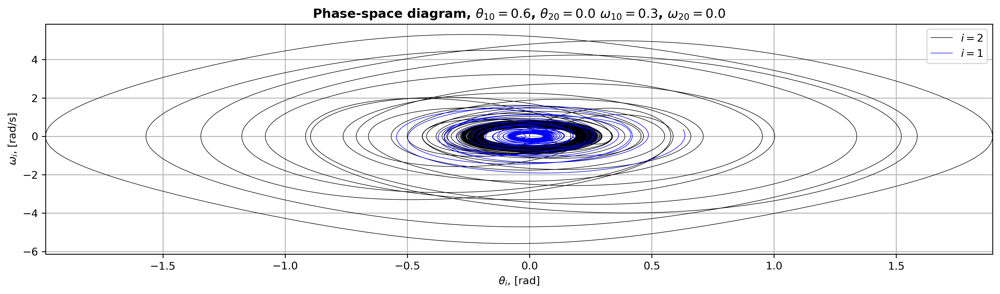

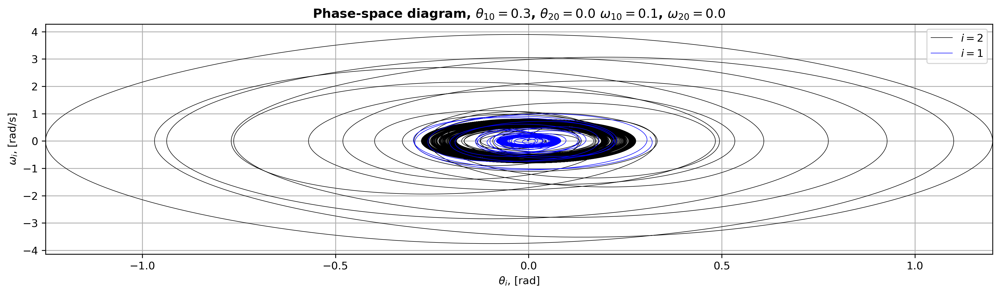

In [47]:
plot_phasespace(double_pendulum_one_theta1, double_pendulum_one_w1, double_pendulum_one_theta2, double_pendulum_one_w2)
plot_phasespace(double_pendulum_two_theta1, double_pendulum_two_w1, double_pendulum_two_theta2, double_pendulum_two_w2)

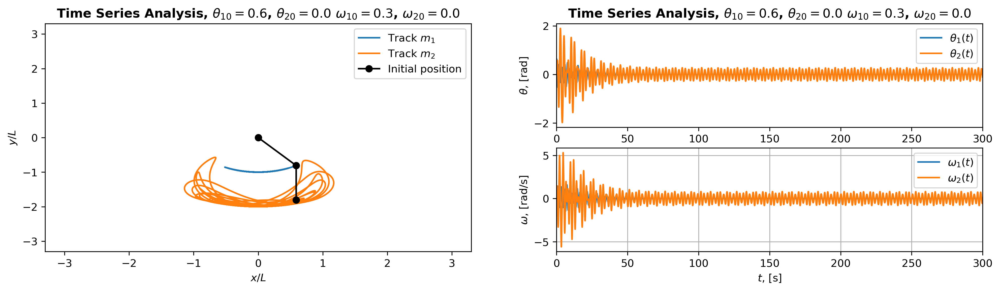

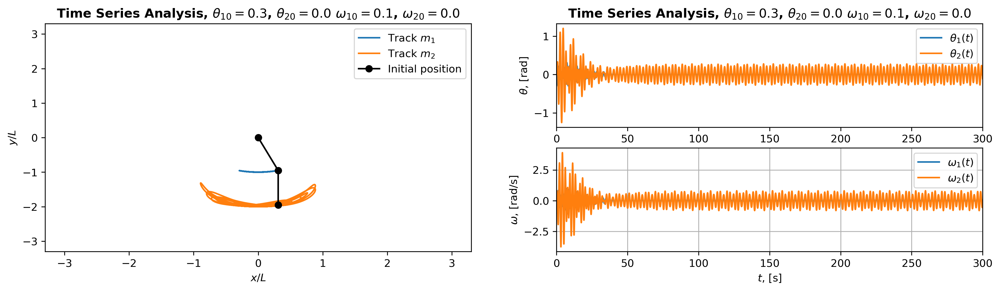

In [48]:
plot_position(x1, y1, x2, y2, double_pendulum_one_theta1, double_pendulum_one_theta2, double_pendulum_one_w1, double_pendulum_one_w2, time)
plot_position(x1_new, y1_new, x2_new, y2_new, double_pendulum_two_theta1, double_pendulum_two_theta2, double_pendulum_two_w1, double_pendulum_two_w2, time)

In [29]:
def plot_thetadifference(theta1, theta1_second, theta2, theta2_second, t):
    difference = theta1 - theta1_second
    difference += np.pi
    difference %= 2 * np.pi
    difference -= np.pi
    difference2 = theta2 - theta2_second
    difference2 += np.pi
    difference2 %= 2 * np.pi
    difference2 -= np.pi
    standard_deviation_threshhold = 0.001
    first_standard_deviation_values = []
    second_standard_deviation_values = []
    first_coupling_location_index = 0
    second_coupling_location_index = 0
    first_standard_deviation_point_made = False
    second_standard_deviation_point_made = False
    for difference_index in range(0, len(difference)):
        first_standard_deviation = np.std(
            difference[difference_index - 100 : difference_index]
        )
        first_standard_deviation_values.append(first_standard_deviation)
        second_standard_deviation = np.std(
            difference2[difference_index - 100 : difference_index]
        )
        second_standard_deviation_values.append(second_standard_deviation)
        if (
            (first_standard_deviation) < standard_deviation_threshhold
            and first_standard_deviation_point_made is False
        ):
            first_coupling_location_index = first_standard_deviation_values.index(
                first_standard_deviation
            )
            first_standard_deviation_point_made = True
        if (
            (second_standard_deviation) < standard_deviation_threshhold
            and second_standard_deviation_point_made is False
        ):
            second_coupling_location_index = second_standard_deviation_values.index(
                second_standard_deviation
            )
            second_standard_deviation_point_made = True
    
    plt.figure(figsize=(6 * figsize, 4 * figsize), dpi=dpi)
    plt.subplot(2, 2, 1)
    plt.plot(t, first_standard_deviation_values, color="green")
    plt.grid()
    if first_coupling_location_index != 0:
        plt.axhline(y=first_standard_deviation, color="r", linewidth=0.8)
    plt.xticks(fontsize= 8)
    plt.yticks(fontsize= 8)
    plt.ylabel(
        r"$\sigma_1$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize = 10)
    plt.title(r"$\sigma_1$ vs. Time (s)", fontsize=12, fontweight="bold")
    
    plt.subplot(2, 2, 2)
    plt.plot(t, np.log(first_standard_deviation_values), color="green")
    plt.grid()
    plt.ylabel(
        r"$\log(\sigma_1)$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize= 10)
    plt.xticks(fontsize = 8)
    plt.yticks(fontsize = 8)
    plt.title(
        r"$\log(\sigma_1)$ vs. Time (s)", fontsize=12, fontweight="bold"
    )
    plt.subplot(2, 2, 3)
    plt.plot(t, second_standard_deviation_values, color="green")
    plt.grid()
    if second_coupling_location_index != 0:
        plt.axhline(y=second_standard_deviation, color="r", linewidth=0.8)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.ylabel(
        r"$\sigma_2$",
        fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize=10)
    plt.title(r"$\sigma_2$ vs. Time (s)", fontsize=12, fontweight="bold")
    
    plt.subplot(2, 2, 4)
    plt.grid()
    plt.plot(t, np.log(second_standard_deviation_values), color="green")
    plt.ylabel(
        r"$\log(\sigma_2)$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize=10)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.title(
        r"$\log(\sigma_2)$ vs. Time (s)", fontsize=12, fontweight="bold"
    )
    plt.suptitle(
        r"$m_{1_1}$"
        + " = "
        + f"{m1_1}"
        + ", "
        + r"$m_{2_1}$"
        + " = "
        + f"{m2_1}"
        + ", "
        + r"$m_{1_2}$"
        + " = "
        + f"{m1_2}"
        + ", "
        + r"$m_{2_2}$"
        + " = "
        + f"{m2_2} "
        + ", "
        + r"$L_{1_1}$"
        + " = "
        + f"{L1_1}"
        + ", "
        + r"$L_{2_1}$"
        + " = "
        + f"{L2_1}"
        + ", "
        + r"$L_{1_2}$"
        + " = "
        + f"{L1_2}"
        + ", "
        + r"$L_{2_2}$"
        + " = "
        + f"{L2_2}"
        + "\n"
        + r"$\theta_{1_1}$"
        + " = "
        + f"{z0_str[0]}"
        + ", "
        + r"$\omega_{1_1}$"
        + " = "
        + f"{z0_str[1]}"
        + ", "
        + r"$\theta_{2_1}$"
        + " = "
        + f"{z0_str[2]}"
        + ", "
        + r"$\omega_{2_1}$"
        + " = "
        + f"{z0_str[3]}"
        + ", "
        + r"$\theta_{1_2}$"
        + " = "
        + f"{z0_str[4]}"
        + ", "
        + r"$\omega_{1_2}$"
        + " = "
        + f"{z0_str[5]}"
        + ", "
        + r"$\theta_{2_2}$"
        + " = "
        + f"{z0_str[6]}"
        + ", "
        + r"$\omega_{2_2}$"
        + " = "
        + f"{z0_str[7]}"
        + "\n"
        + r"K"
        + " = "
        + f"{coupling_strength_K}"
        + ", "
        + r"$\sigma_T$"
        + " = "
        + f"{standard_deviation_threshhold}",
    )
    plt.subplots_adjust(left=0.12,
                    bottom=0.11,
                    right=0.929,
                    top=0.8,
                    wspace=0.407,
                    hspace=0.562)
    plt.tight_layout(pad=15)
    plt.savefig("plots/double-pendulum-synchronization-std-deviation_control.pdf", dpi=300)
    plt.show()
    
    plt.figure(figsize=(4 * figsize, 3 * figsize), dpi=dpi)
    plt.subplot(1, 2, 1)
    plt.plot(t, difference, color="green")
    plt.grid()
    if first_coupling_location_index != 0:
        plt.axvline(x=t[first_coupling_location_index], color="r")
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel(r"Time (s)", fontsize=8, labelpad=12)
    plt.ylabel(r"$\theta_{1_1}$- $\theta_{1_2}$ (rad)", fontsize=12)
    plt.title(
        r"$\theta_{1_1}$- $\theta_{1_2}$ (rad) vs. Time (s)",
        fontsize=14,
    )
    plt.subplot(1, 2, 2)
    plt.plot(t, difference2, color="green")
    plt.grid()
    if second_coupling_location_index != 0:
        plt.axvline(x=t[second_coupling_location_index], color="r")
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel(r"Time (s)", fontsize=8, labelpad=12)
    plt.ylabel(r"$\theta_{2_1}$- $\theta_{2_2}$ (rad)", fontsize=12)
    plt.title(
        r"$\theta_{2_1}$- $\theta_{2_2}$ (rad) vs. Time (s)",
        fontsize=14,
    )
    plt.suptitle(
        r"$m_{1_1}$"
        + " = "
        + f"{m1_1}"
        + ", "
        + r"$m_{2_1}$"
        + " = "
        + f"{m2_1}"
        + ", "
        + r"$m_{1_2}$"
        + " = "
        + f"{m1_2}"
        + ", "
        + r"$m_{2_2}$"
        + " = "
        + f"{m2_2} "
        + ", "
        + r"$L_{1_1}$"
        + " = "
        + f"{L1_1}"
        + ", "
        + r"$L_{2_1}$"
        + " = "
        + f"{L2_1}"
        + ", "
        + r"$L_{1_2}$"
        + " = "
        + f"{L1_2}"
        + ", "
        + r"$L_{2_2}$"
        + " = "
        + f"{L2_2}"
        + "\n"
        + r"$\theta_{1_1}$"
        + " = "
        + f"{z0_str[0]}"
        + ", "
        + r"$\omega_{1_1}$"
        + " = "
        + f"{z0_str[1]}"
        + ", "
        + r"$\theta_{2_1}$"
        + " = "
        + f"{z0_str[2]}"
        + ", "
        + r"$\omega_{2_1}$"
        + " = "
        + f"{z0_str[3]}"
        + ", "
        + r"$\theta_{1_2}$"
        + " = "
        + f"{z0_str[4]}"
        + ", "
        + r"$\omega_{1_2}$"
        + " = "
        + f"{z0_str[5]}"
        + ", "
        + r"$\theta_{2_2}$"
        + " = "
        + f"{z0_str[6]}"
        + ", "
        + r"$\omega_{2_2}$"
        + " = "
        + f"{z0_str[7]}"
        + "\n"
        + r"K"
        + " = "
        + f"{coupling_strength_K}"
        + ", "
        + r"$\sigma_T$"
        + " = "
        + f"{standard_deviation_threshhold}",
    )
    plt.subplots_adjust(top=0.77)
    plt.savefig("plots/double-pendulum-synchronization-theta-difference_control.pdf", dpi=300)
    plt.show()

c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:223: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:257: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
<ipython-input-29-19b339288f40>:174: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  plt.tight_layout(pad=15)


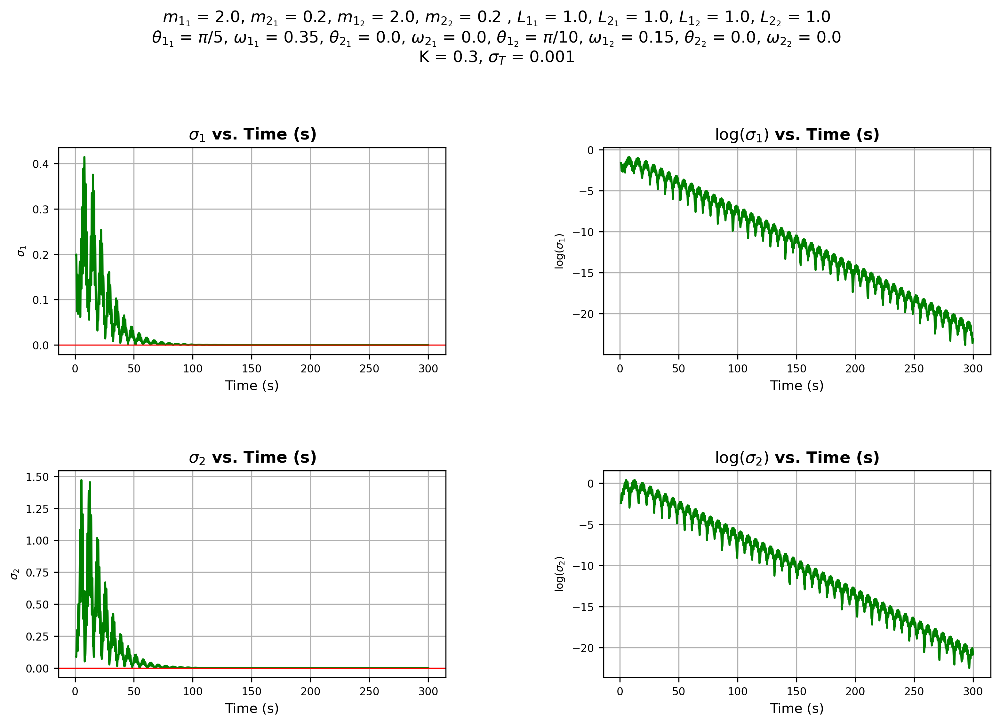

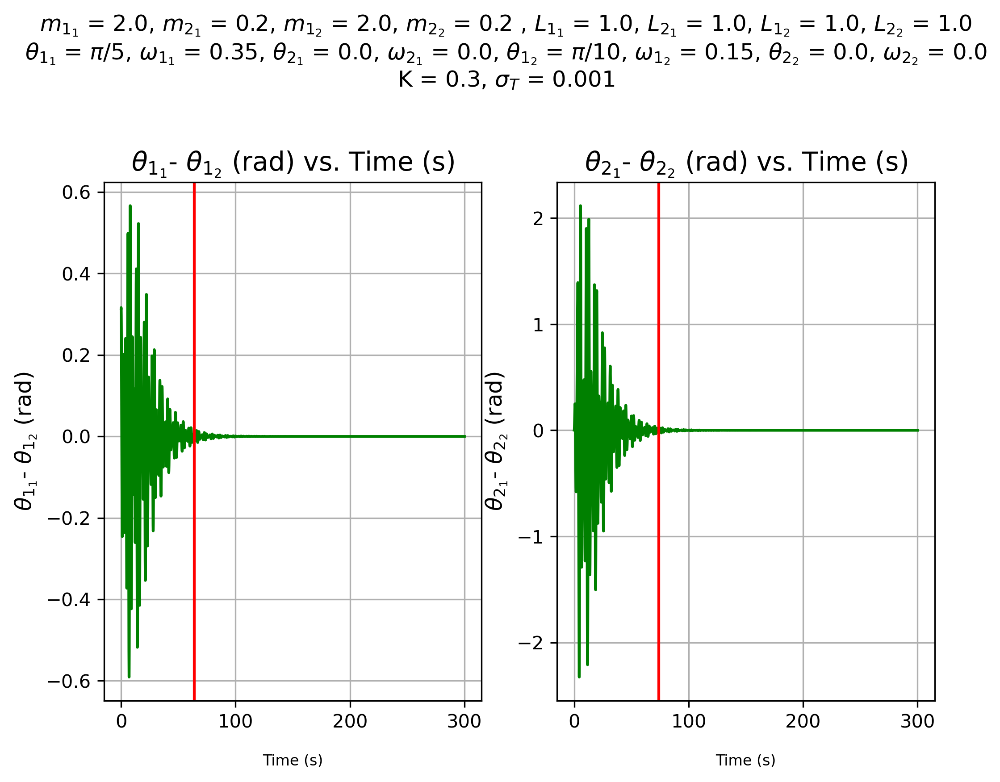

In [30]:
plot_thetadifference(
    double_pendulum_one_theta1,
    double_pendulum_two_theta1,
    double_pendulum_one_theta2,
    double_pendulum_two_theta2,
    time,
)

In [31]:
figsize = 2
dpi = 300
g = 9.81
pi = np.pi
# First double pendulum
L1_1 = 1.0
L2_1 = 1.0
m1_1 = 2.0 * 100 # multiying m1 by 100
m2_1 = 1 / 5
# Second double pendulum
L1_2 = 1.0
L2_2 = 1.0
m1_2 = 2.0
m2_2 = 1 / 5
# Initial first double pendulum configuration
first_double_pendulum_configuration = [pi/5, 0.35, 0.0, 0.0]
# Initial second double pendulum configuration
second_double_pendulum_configuration = [pi / 10, 0.15, 0.0, 0.0]
# Initial double pendulum system configuration
z0 = [*first_double_pendulum_configuration, *second_double_pendulum_configuration]
z0_str = [
    rf"$\pi/5$",
    rf"${z0[1]}$",
    rf"${z0[2]}$",
    rf"${z0[3]}$",
    rf"$\pi/10$",
    rf"${z0[5]}$",
    rf"${z0[6]}$",
    rf"${z0[7]}$",
]
# System constants
coupling_strength_K = 0.3
number_of_pendulums = int(len(z0) / 4)
# Time interval configuration
time_start = 0
time_stop = 300
time_step = 0.01
time = np.arange(time_start, time_stop + time_step, time_step)
# Numerical integration
z = integrate.odeint(
    double_pendulum_computations,
    z0,
    time,
    args=(
        L1_1,
        L2_1,
        L1_2,
        L2_2,
        m1_1,
        m2_1,
        m1_2,
        m2_2,
        g,
        coupling_strength_K,
        number_of_pendulums,
    ),
)

(
    double_pendulum_one_theta1,
    double_pendulum_one_w1,
    double_pendulum_one_theta2,
    double_pendulum_one_w2,
) = (z[:, 0], z[:, 1], z[:, 2], z[:, 3])
(
    double_pendulum_two_theta1,
    double_pendulum_two_w1,
    double_pendulum_two_theta2,
    double_pendulum_two_w2,
) = (z[:, 4], z[:, 5], z[:, 6], z[:, 7])

x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(
    double_pendulum_one_theta1,
    double_pendulum_one_w1,
    double_pendulum_one_theta2,
    double_pendulum_one_w2,
    L1_1,
    L2_1,
)
x1_new, y1_new, x2_new, y2_new, vx1_new, vy1_new, vx2_new, vy2_new = to_cartesian(
    double_pendulum_two_theta1,
    double_pendulum_two_w1,
    double_pendulum_two_theta2,
    double_pendulum_two_w2,
    L1_2,
    L2_2,
)

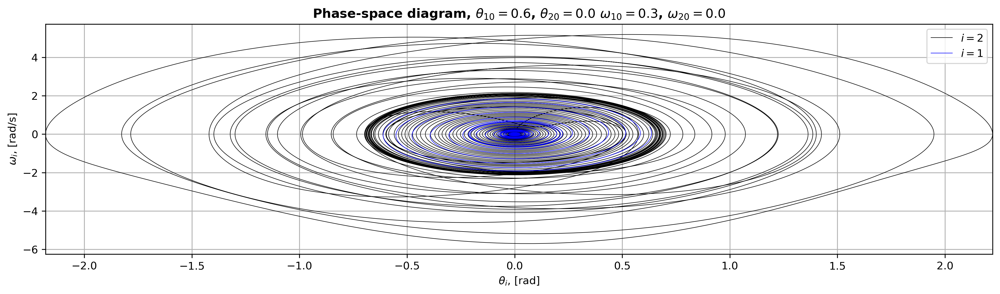

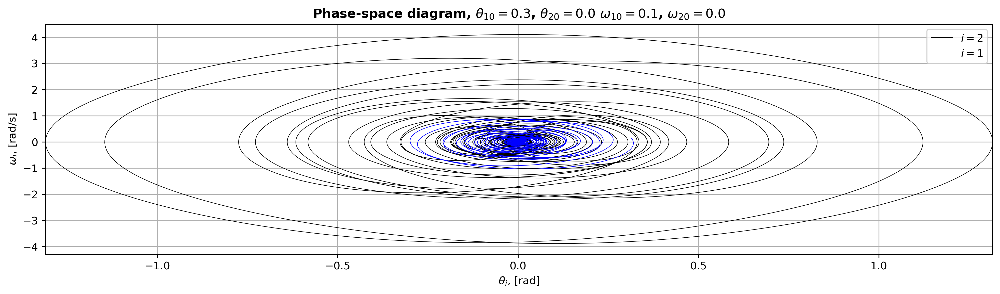

In [20]:
plot_phasespace(double_pendulum_one_theta1, double_pendulum_one_w1, double_pendulum_one_theta2, double_pendulum_one_w2)
plot_phasespace(double_pendulum_two_theta1, double_pendulum_two_w1, double_pendulum_two_theta2, double_pendulum_two_w2)

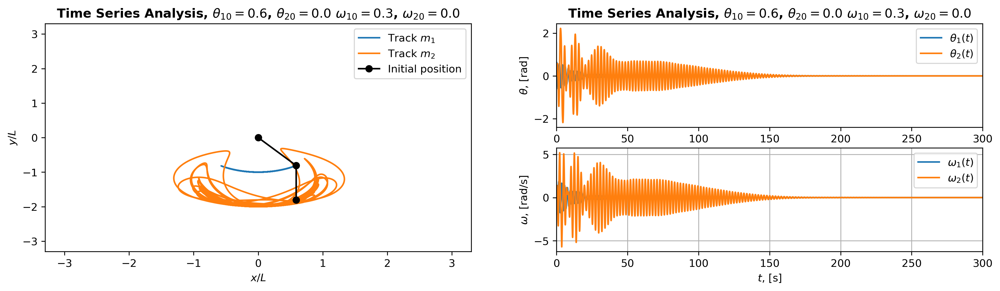

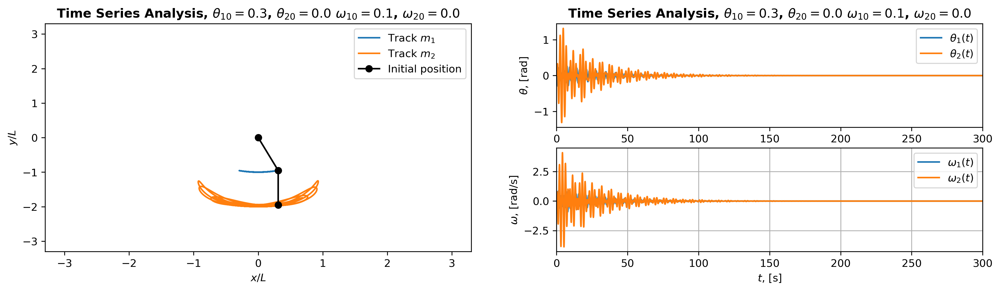

In [21]:
plot_position(x1, y1, x2, y2, double_pendulum_one_theta1, double_pendulum_one_theta2, double_pendulum_one_w1, double_pendulum_one_w2, time)
plot_position(x1_new, y1_new, x2_new, y2_new, double_pendulum_two_theta1, double_pendulum_two_theta2, double_pendulum_two_w1, double_pendulum_two_w2, time)

In [32]:
def plot_thetadifference(theta1, theta1_second, theta2, theta2_second, t):
    difference = theta1 - theta1_second
    difference += np.pi
    difference %= 2 * np.pi
    difference -= np.pi
    difference2 = theta2 - theta2_second
    difference2 += np.pi
    difference2 %= 2 * np.pi
    difference2 -= np.pi
    standard_deviation_threshhold = 0.001
    first_standard_deviation_values = []
    second_standard_deviation_values = []
    first_coupling_location_index = 0
    second_coupling_location_index = 0
    first_standard_deviation_point_made = False
    second_standard_deviation_point_made = False
    for difference_index in range(0, len(difference)):
        first_standard_deviation = np.std(
            difference[difference_index - 100 : difference_index]
        )
        first_standard_deviation_values.append(first_standard_deviation)
        second_standard_deviation = np.std(
            difference2[difference_index - 100 : difference_index]
        )
        second_standard_deviation_values.append(second_standard_deviation)
        if (
            (first_standard_deviation) < standard_deviation_threshhold
            and first_standard_deviation_point_made is False
        ):
            first_coupling_location_index = first_standard_deviation_values.index(
                first_standard_deviation
            )
            first_standard_deviation_point_made = True
        if (
            (second_standard_deviation) < standard_deviation_threshhold
            and second_standard_deviation_point_made is False
        ):
            second_coupling_location_index = second_standard_deviation_values.index(
                second_standard_deviation
            )
            second_standard_deviation_point_made = True
    
    plt.figure(figsize=(6 * figsize, 4 * figsize), dpi=dpi)
    plt.subplot(2, 2, 1)
    plt.plot(t, first_standard_deviation_values, color="green")
    plt.grid()
    if first_coupling_location_index != 0:
        plt.axhline(y=first_standard_deviation, color="r", linewidth=0.8)
    plt.xticks(fontsize= 8)
    plt.yticks(fontsize= 8)
    plt.ylabel(
        r"$\sigma_1$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize = 10)
    plt.title(r"$\sigma_1$ vs. Time (s)", fontsize=12, fontweight="bold")
    
    plt.subplot(2, 2, 2)
    plt.plot(t, np.log(first_standard_deviation_values), color="green")
    plt.grid()
    plt.ylabel(
        r"$\log(\sigma_1)$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize= 10)
    plt.xticks(fontsize = 8)
    plt.yticks(fontsize = 8)
    plt.title(
        r"$\log(\sigma_1)$ vs. Time (s)", fontsize=12, fontweight="bold"
    )
    plt.subplot(2, 2, 3)
    plt.plot(t, second_standard_deviation_values, color="green")
    plt.grid()
    if second_coupling_location_index != 0:
        plt.axhline(y=second_standard_deviation, color="r", linewidth=0.8)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.ylabel(
        r"$\sigma_2$",
        fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize=10)
    plt.title(r"$\sigma_2$ vs. Time (s)", fontsize=12, fontweight="bold")
    
    plt.subplot(2, 2, 4)
    plt.grid()
    plt.plot(t, np.log(second_standard_deviation_values), color="green")
    plt.ylabel(
        r"$\log(\sigma_2)$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize=10)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.title(
        r"$\log(\sigma_2)$ vs. Time (s)", fontsize=12, fontweight="bold"
    )
    plt.suptitle(
        r"$m_{1_1}$"
        + " = "
        + f"{m1_1}"
        + ", "
        + r"$m_{2_1}$"
        + " = "
        + f"{m2_1}"
        + ", "
        + r"$m_{1_2}$"
        + " = "
        + f"{m1_2}"
        + ", "
        + r"$m_{2_2}$"
        + " = "
        + f"{m2_2} "
        + ", "
        + r"$L_{1_1}$"
        + " = "
        + f"{L1_1}"
        + ", "
        + r"$L_{2_1}$"
        + " = "
        + f"{L2_1}"
        + ", "
        + r"$L_{1_2}$"
        + " = "
        + f"{L1_2}"
        + ", "
        + r"$L_{2_2}$"
        + " = "
        + f"{L2_2}"
        + "\n"
        + r"$\theta_{1_1}$"
        + " = "
        + f"{z0_str[0]}"
        + ", "
        + r"$\omega_{1_1}$"
        + " = "
        + f"{z0_str[1]}"
        + ", "
        + r"$\theta_{2_1}$"
        + " = "
        + f"{z0_str[2]}"
        + ", "
        + r"$\omega_{2_1}$"
        + " = "
        + f"{z0_str[3]}"
        + ", "
        + r"$\theta_{1_2}$"
        + " = "
        + f"{z0_str[4]}"
        + ", "
        + r"$\omega_{1_2}$"
        + " = "
        + f"{z0_str[5]}"
        + ", "
        + r"$\theta_{2_2}$"
        + " = "
        + f"{z0_str[6]}"
        + ", "
        + r"$\omega_{2_2}$"
        + " = "
        + f"{z0_str[7]}"
        + "\n"
        + r"K"
        + " = "
        + f"{coupling_strength_K}"
        + ", "
        + r"$\sigma_T$"
        + " = "
        + f"{standard_deviation_threshhold}",
    )
    plt.subplots_adjust(left=0.12,
                    bottom=0.11,
                    right=0.929,
                    top=0.8,
                    wspace=0.407,
                    hspace=0.562)
    plt.tight_layout(pad=15)
    plt.savefig("plots/double-pendulum-synchronization-std-deviation_t1.pdf", dpi=300)
    plt.show()
    
    plt.figure(figsize=(4 * figsize, 3 * figsize), dpi=dpi)
    plt.subplot(1, 2, 1)
    plt.plot(t, difference, color="green")
    plt.grid()
    if first_coupling_location_index != 0:
        plt.axvline(x=t[first_coupling_location_index], color="r")
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel(r"Time (s)", fontsize=8, labelpad=12)
    plt.ylabel(r"$\theta_{1_1}$- $\theta_{1_2}$ (rad)", fontsize=12)
    plt.title(
        r"$\theta_{1_1}$- $\theta_{1_2}$ (rad) vs. Time (s)",
        fontsize=14,
    )
    plt.subplot(1, 2, 2)
    plt.plot(t, difference2, color="green")
    plt.grid()
    if second_coupling_location_index != 0:
        plt.axvline(x=t[second_coupling_location_index], color="r")
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel(r"Time (s)", fontsize=8, labelpad=12)
    plt.ylabel(r"$\theta_{2_1}$- $\theta_{2_2}$ (rad)", fontsize=12)
    plt.title(
        r"$\theta_{2_1}$- $\theta_{2_2}$ (rad) vs. Time (s)",
        fontsize=14,
    )
    plt.suptitle(
        r"$m_{1_1}$"
        + " = "
        + f"{m1_1}"
        + ", "
        + r"$m_{2_1}$"
        + " = "
        + f"{m2_1}"
        + ", "
        + r"$m_{1_2}$"
        + " = "
        + f"{m1_2}"
        + ", "
        + r"$m_{2_2}$"
        + " = "
        + f"{m2_2} "
        + ", "
        + r"$L_{1_1}$"
        + " = "
        + f"{L1_1}"
        + ", "
        + r"$L_{2_1}$"
        + " = "
        + f"{L2_1}"
        + ", "
        + r"$L_{1_2}$"
        + " = "
        + f"{L1_2}"
        + ", "
        + r"$L_{2_2}$"
        + " = "
        + f"{L2_2}"
        + "\n"
        + r"$\theta_{1_1}$"
        + " = "
        + f"{z0_str[0]}"
        + ", "
        + r"$\omega_{1_1}$"
        + " = "
        + f"{z0_str[1]}"
        + ", "
        + r"$\theta_{2_1}$"
        + " = "
        + f"{z0_str[2]}"
        + ", "
        + r"$\omega_{2_1}$"
        + " = "
        + f"{z0_str[3]}"
        + ", "
        + r"$\theta_{1_2}$"
        + " = "
        + f"{z0_str[4]}"
        + ", "
        + r"$\omega_{1_2}$"
        + " = "
        + f"{z0_str[5]}"
        + ", "
        + r"$\theta_{2_2}$"
        + " = "
        + f"{z0_str[6]}"
        + ", "
        + r"$\omega_{2_2}$"
        + " = "
        + f"{z0_str[7]}"
        + "\n"
        + r"K"
        + " = "
        + f"{coupling_strength_K}"
        + ", "
        + r"$\sigma_T$"
        + " = "
        + f"{standard_deviation_threshhold}",
    )
    plt.subplots_adjust(top=0.77)
    plt.savefig("plots/double-pendulum-synchronization-theta-difference_t1.pdf", dpi=300)
    plt.show()

c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:223: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:257: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
<ipython-input-32-2175ad2d6db1>:174: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  plt.tight_layout(pad=15)


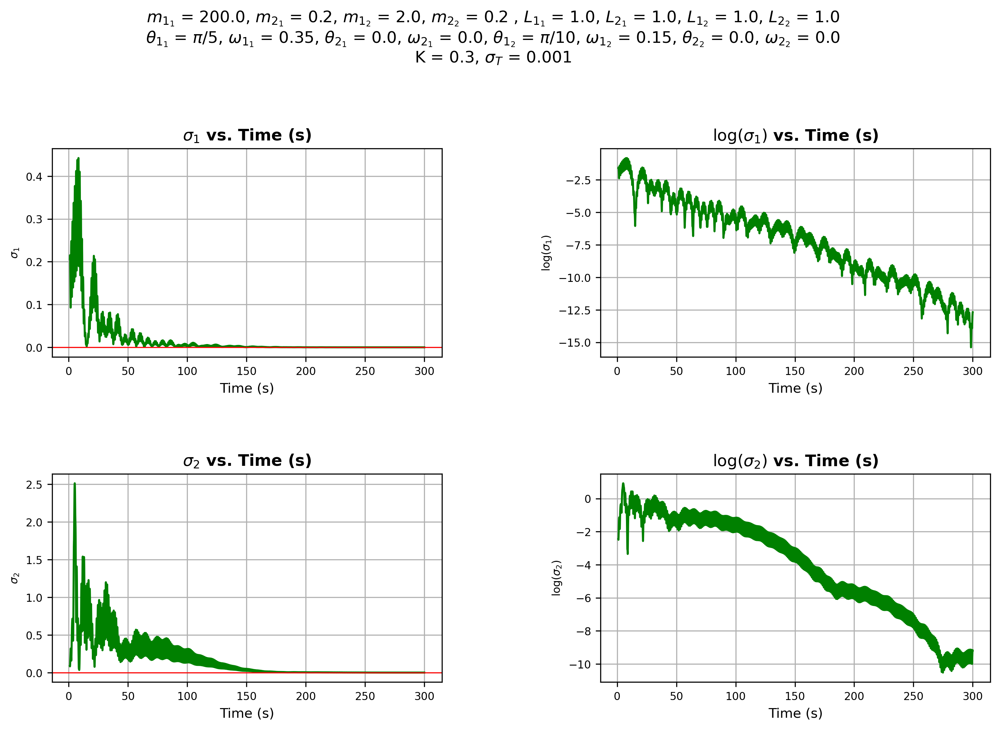

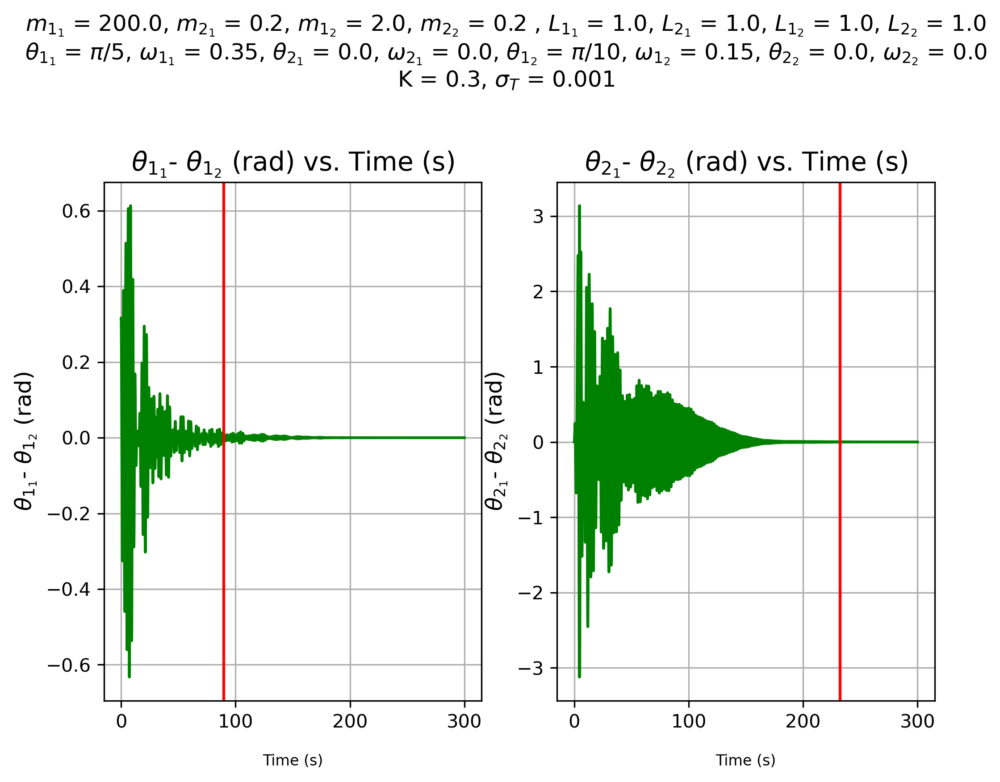

In [33]:
plot_thetadifference(
    double_pendulum_one_theta1,
    double_pendulum_two_theta1,
    double_pendulum_one_theta2,
    double_pendulum_two_theta2,
    time,
)

In [34]:
figsize = 2
dpi = 300
g = 9.81
pi = np.pi
# First double pendulum
L1_1 = 1.0
L2_1 = 1.0
m1_1 = 2.0
m2_1 = 1 / 5 * 100 # multiying m2 by 100
# Second double pendulum
L1_2 = 1.0
L2_2 = 1.0
m1_2 = 2.0
m2_2 = 1 / 5
# Initial first double pendulum configuration
first_double_pendulum_configuration = [pi/5, 0.35, 0.0, 0.0]
# Initial second double pendulum configuration
second_double_pendulum_configuration = [pi / 10, 0.15, 0.0, 0.0]
# Initial double pendulum system configuration
z0 = [*first_double_pendulum_configuration, *second_double_pendulum_configuration]
z0_str = [
    rf"$\pi/5$",
    rf"${z0[1]}$",
    rf"${z0[2]}$",
    rf"${z0[3]}$",
    rf"$\pi/10$",
    rf"${z0[5]}$",
    rf"${z0[6]}$",
    rf"${z0[7]}$",
]
# System constants
coupling_strength_K = 0.3
number_of_pendulums = int(len(z0) / 4)
# Time interval configuration
time_start = 0
time_stop = 300
time_step = 0.01
time = np.arange(time_start, time_stop + time_step, time_step)
# Numerical integration
z = integrate.odeint(
    double_pendulum_computations,
    z0,
    time,
    args=(
        L1_1,
        L2_1,
        L1_2,
        L2_2,
        m1_1,
        m2_1,
        m1_2,
        m2_2,
        g,
        coupling_strength_K,
        number_of_pendulums,
    ),
)

(
    double_pendulum_one_theta1,
    double_pendulum_one_w1,
    double_pendulum_one_theta2,
    double_pendulum_one_w2,
) = (z[:, 0], z[:, 1], z[:, 2], z[:, 3])
(
    double_pendulum_two_theta1,
    double_pendulum_two_w1,
    double_pendulum_two_theta2,
    double_pendulum_two_w2,
) = (z[:, 4], z[:, 5], z[:, 6], z[:, 7])

x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(
    double_pendulum_one_theta1,
    double_pendulum_one_w1,
    double_pendulum_one_theta2,
    double_pendulum_one_w2,
    L1_1,
    L2_1,
)
x1_new, y1_new, x2_new, y2_new, vx1_new, vy1_new, vx2_new, vy2_new = to_cartesian(
    double_pendulum_two_theta1,
    double_pendulum_two_w1,
    double_pendulum_two_theta2,
    double_pendulum_two_w2,
    L1_2,
    L2_2,
)

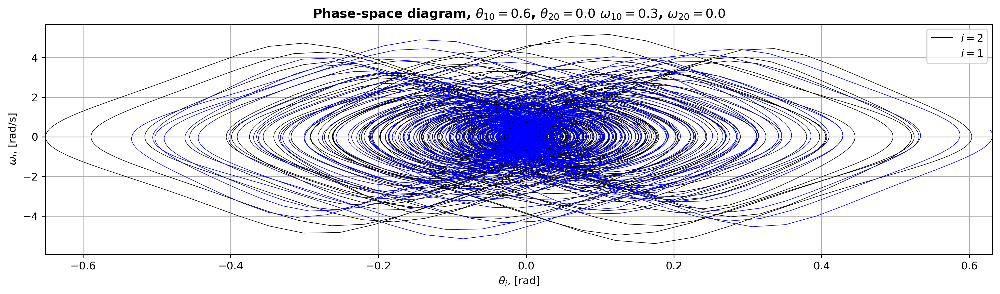

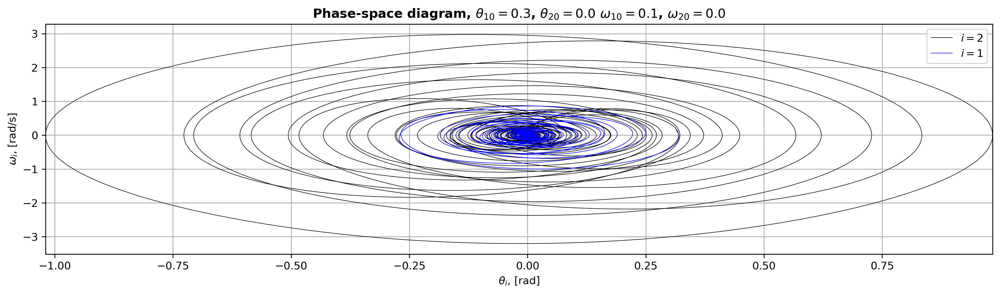

In [24]:
plot_phasespace(double_pendulum_one_theta1, double_pendulum_one_w1, double_pendulum_one_theta2, double_pendulum_one_w2)
plot_phasespace(double_pendulum_two_theta1, double_pendulum_two_w1, double_pendulum_two_theta2, double_pendulum_two_w2)

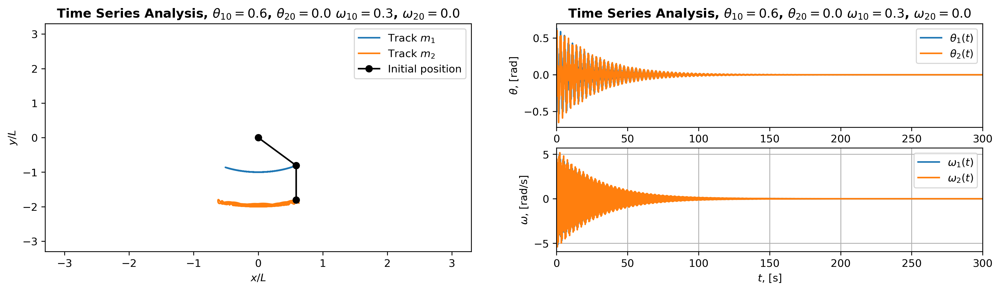

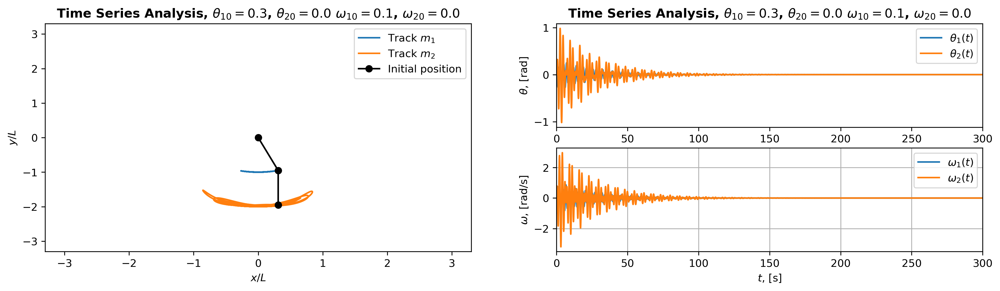

In [25]:
plot_position(x1, y1, x2, y2, double_pendulum_one_theta1, double_pendulum_one_theta2, double_pendulum_one_w1, double_pendulum_one_w2, time)
plot_position(x1_new, y1_new, x2_new, y2_new, double_pendulum_two_theta1, double_pendulum_two_theta2, double_pendulum_two_w1, double_pendulum_two_w2, time)

In [35]:
def plot_thetadifference(theta1, theta1_second, theta2, theta2_second, t):
    difference = theta1 - theta1_second
    difference += np.pi
    difference %= 2 * np.pi
    difference -= np.pi
    difference2 = theta2 - theta2_second
    difference2 += np.pi
    difference2 %= 2 * np.pi
    difference2 -= np.pi
    standard_deviation_threshhold = 0.001
    first_standard_deviation_values = []
    second_standard_deviation_values = []
    first_coupling_location_index = 0
    second_coupling_location_index = 0
    first_standard_deviation_point_made = False
    second_standard_deviation_point_made = False
    for difference_index in range(0, len(difference)):
        first_standard_deviation = np.std(
            difference[difference_index - 100 : difference_index]
        )
        first_standard_deviation_values.append(first_standard_deviation)
        second_standard_deviation = np.std(
            difference2[difference_index - 100 : difference_index]
        )
        second_standard_deviation_values.append(second_standard_deviation)
        if (
            (first_standard_deviation) < standard_deviation_threshhold
            and first_standard_deviation_point_made is False
        ):
            first_coupling_location_index = first_standard_deviation_values.index(
                first_standard_deviation
            )
            first_standard_deviation_point_made = True
        if (
            (second_standard_deviation) < standard_deviation_threshhold
            and second_standard_deviation_point_made is False
        ):
            second_coupling_location_index = second_standard_deviation_values.index(
                second_standard_deviation
            )
            second_standard_deviation_point_made = True
    
    plt.figure(figsize=(6 * figsize, 4 * figsize), dpi=dpi)
    plt.subplot(2, 2, 1)
    plt.plot(t, first_standard_deviation_values, color="green")
    plt.grid()
    if first_coupling_location_index != 0:
        plt.axhline(y=first_standard_deviation, color="r", linewidth=0.8)
    plt.xticks(fontsize= 8)
    plt.yticks(fontsize= 8)
    plt.ylabel(
        r"$\sigma_1$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize = 10)
    plt.title(r"$\sigma_1$ vs. Time (s)", fontsize=12, fontweight="bold")
    
    plt.subplot(2, 2, 2)
    plt.plot(t, np.log(first_standard_deviation_values), color="green")
    plt.grid()
    plt.ylabel(
        r"$\log(\sigma_1)$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize= 10)
    plt.xticks(fontsize = 8)
    plt.yticks(fontsize = 8)
    plt.title(
        r"$\log(\sigma_1)$ vs. Time (s)", fontsize=12, fontweight="bold"
    )
    plt.subplot(2, 2, 3)
    plt.plot(t, second_standard_deviation_values, color="green")
    plt.grid()
    if second_coupling_location_index != 0:
        plt.axhline(y=second_standard_deviation, color="r", linewidth=0.8)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.ylabel(
        r"$\sigma_2$",
        fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize=10)
    plt.title(r"$\sigma_2$ vs. Time (s)", fontsize=12, fontweight="bold")
    
    plt.subplot(2, 2, 4)
    plt.grid()
    plt.plot(t, np.log(second_standard_deviation_values), color="green")
    plt.ylabel(
        r"$\log(\sigma_2)$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize=10)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.title(
        r"$\log(\sigma_2)$ vs. Time (s)", fontsize=12, fontweight="bold"
    )
    plt.suptitle(
        r"$m_{1_1}$"
        + " = "
        + f"{m1_1}"
        + ", "
        + r"$m_{2_1}$"
        + " = "
        + f"{m2_1}"
        + ", "
        + r"$m_{1_2}$"
        + " = "
        + f"{m1_2}"
        + ", "
        + r"$m_{2_2}$"
        + " = "
        + f"{m2_2} "
        + ", "
        + r"$L_{1_1}$"
        + " = "
        + f"{L1_1}"
        + ", "
        + r"$L_{2_1}$"
        + " = "
        + f"{L2_1}"
        + ", "
        + r"$L_{1_2}$"
        + " = "
        + f"{L1_2}"
        + ", "
        + r"$L_{2_2}$"
        + " = "
        + f"{L2_2}"
        + "\n"
        + r"$\theta_{1_1}$"
        + " = "
        + f"{z0_str[0]}"
        + ", "
        + r"$\omega_{1_1}$"
        + " = "
        + f"{z0_str[1]}"
        + ", "
        + r"$\theta_{2_1}$"
        + " = "
        + f"{z0_str[2]}"
        + ", "
        + r"$\omega_{2_1}$"
        + " = "
        + f"{z0_str[3]}"
        + ", "
        + r"$\theta_{1_2}$"
        + " = "
        + f"{z0_str[4]}"
        + ", "
        + r"$\omega_{1_2}$"
        + " = "
        + f"{z0_str[5]}"
        + ", "
        + r"$\theta_{2_2}$"
        + " = "
        + f"{z0_str[6]}"
        + ", "
        + r"$\omega_{2_2}$"
        + " = "
        + f"{z0_str[7]}"
        + "\n"
        + r"K"
        + " = "
        + f"{coupling_strength_K}"
        + ", "
        + r"$\sigma_T$"
        + " = "
        + f"{standard_deviation_threshhold}",
    )
    plt.subplots_adjust(left=0.12,
                    bottom=0.11,
                    right=0.929,
                    top=0.8,
                    wspace=0.407,
                    hspace=0.562)
    plt.tight_layout(pad=15)
    plt.savefig("plots/double-pendulum-synchronization-std-deviation_t2.pdf", dpi=300)
    plt.show()
    
    plt.figure(figsize=(4 * figsize, 3 * figsize), dpi=dpi)
    plt.subplot(1, 2, 1)
    plt.plot(t, difference, color="green")
    plt.grid()
    if first_coupling_location_index != 0:
        plt.axvline(x=t[first_coupling_location_index], color="r")
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel(r"Time (s)", fontsize=8, labelpad=12)
    plt.ylabel(r"$\theta_{1_1}$- $\theta_{1_2}$ (rad)", fontsize=12)
    plt.title(
        r"$\theta_{1_1}$- $\theta_{1_2}$ (rad) vs. Time (s)",
        fontsize=14,
    )
    plt.subplot(1, 2, 2)
    plt.plot(t, difference2, color="green")
    plt.grid()
    if second_coupling_location_index != 0:
        plt.axvline(x=t[second_coupling_location_index], color="r")
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel(r"Time (s)", fontsize=8, labelpad=12)
    plt.ylabel(r"$\theta_{2_1}$- $\theta_{2_2}$ (rad)", fontsize=12)
    plt.title(
        r"$\theta_{2_1}$- $\theta_{2_2}$ (rad) vs. Time (s)",
        fontsize=14,
    )
    plt.suptitle(
        r"$m_{1_1}$"
        + " = "
        + f"{m1_1}"
        + ", "
        + r"$m_{2_1}$"
        + " = "
        + f"{m2_1}"
        + ", "
        + r"$m_{1_2}$"
        + " = "
        + f"{m1_2}"
        + ", "
        + r"$m_{2_2}$"
        + " = "
        + f"{m2_2} "
        + ", "
        + r"$L_{1_1}$"
        + " = "
        + f"{L1_1}"
        + ", "
        + r"$L_{2_1}$"
        + " = "
        + f"{L2_1}"
        + ", "
        + r"$L_{1_2}$"
        + " = "
        + f"{L1_2}"
        + ", "
        + r"$L_{2_2}$"
        + " = "
        + f"{L2_2}"
        + "\n"
        + r"$\theta_{1_1}$"
        + " = "
        + f"{z0_str[0]}"
        + ", "
        + r"$\omega_{1_1}$"
        + " = "
        + f"{z0_str[1]}"
        + ", "
        + r"$\theta_{2_1}$"
        + " = "
        + f"{z0_str[2]}"
        + ", "
        + r"$\omega_{2_1}$"
        + " = "
        + f"{z0_str[3]}"
        + ", "
        + r"$\theta_{1_2}$"
        + " = "
        + f"{z0_str[4]}"
        + ", "
        + r"$\omega_{1_2}$"
        + " = "
        + f"{z0_str[5]}"
        + ", "
        + r"$\theta_{2_2}$"
        + " = "
        + f"{z0_str[6]}"
        + ", "
        + r"$\omega_{2_2}$"
        + " = "
        + f"{z0_str[7]}"
        + "\n"
        + r"K"
        + " = "
        + f"{coupling_strength_K}"
        + ", "
        + r"$\sigma_T$"
        + " = "
        + f"{standard_deviation_threshhold}",
    )
    plt.subplots_adjust(top=0.77)
    plt.savefig("plots/double-pendulum-synchronization-theta-difference_t2.pdf", dpi=300)
    plt.show()

c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:223: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:257: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
<ipython-input-35-1d8414194c88>:174: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  plt.tight_layout(pad=15)


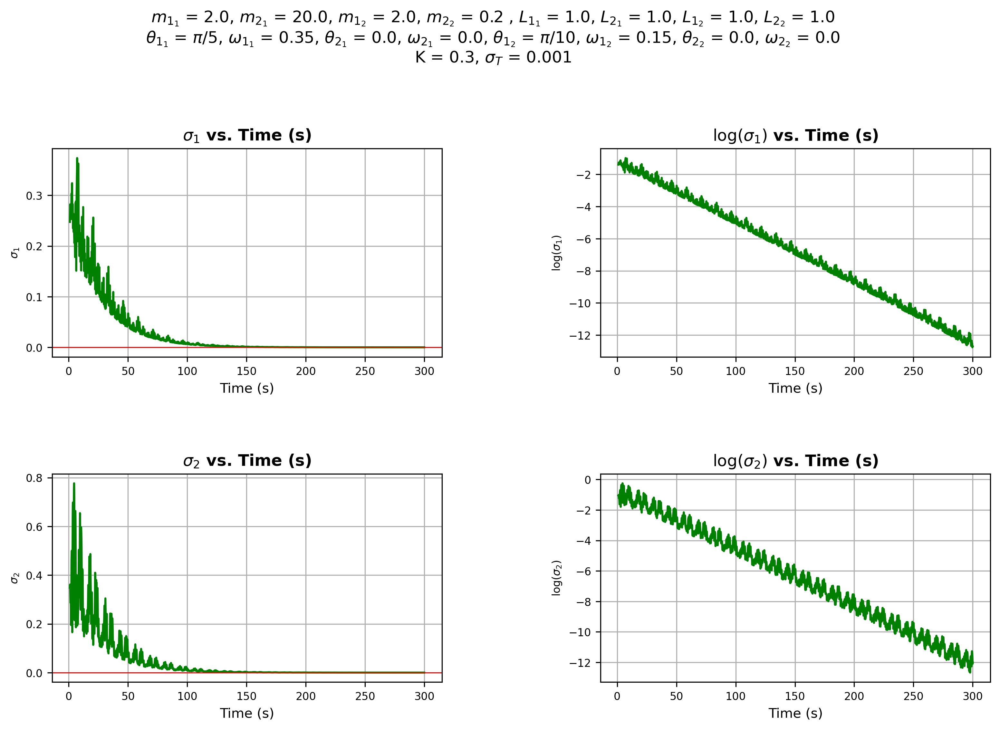

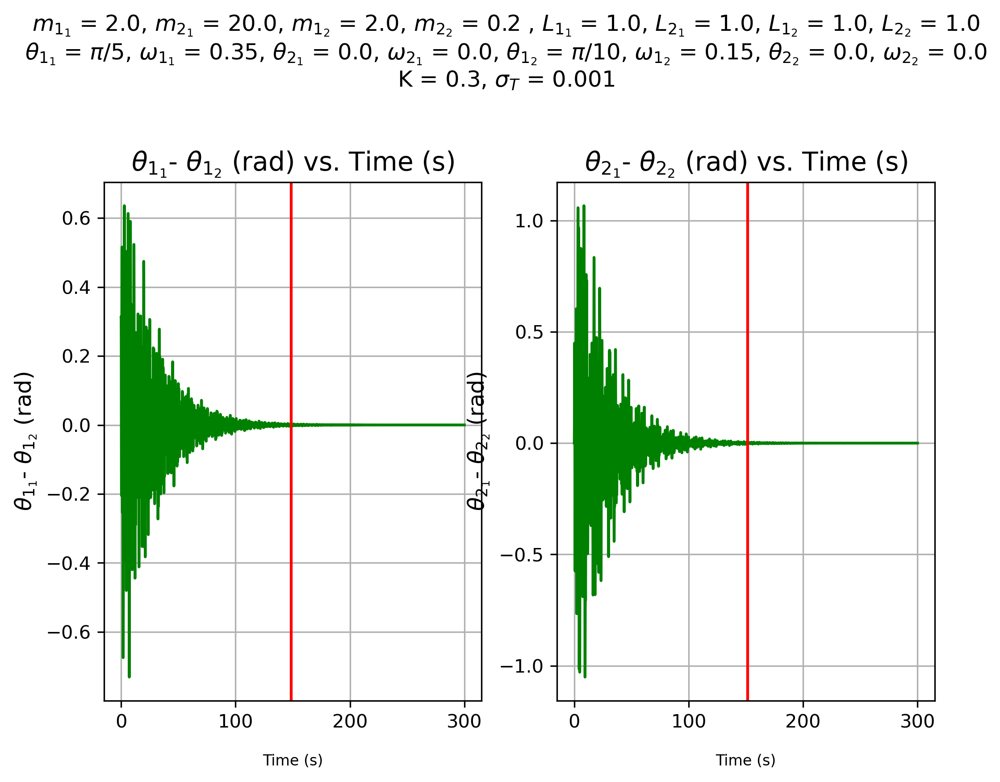

In [36]:
plot_thetadifference(
    double_pendulum_one_theta1,
    double_pendulum_two_theta1,
    double_pendulum_one_theta2,
    double_pendulum_two_theta2,
    time,
)

In [37]:
figsize = 2
dpi = 300
g = 9.81
pi = np.pi
# First double pendulum
L1_1 = 1.0
L2_1 = 1.0
m1_1 = 2.0 
m2_1 = 1 / 5 * 100 # multiying m2 by 100
# Second double pendulum
L1_2 = 1.0
L2_2 = 1.0
m1_2 = 2.0
m2_2 = 1 / 5 * 100 # multiying m2 by 100
# Initial first double pendulum configuration
first_double_pendulum_configuration = [pi/5, 0.35, 0.0, 0.0]
# Initial second double pendulum configuration
second_double_pendulum_configuration = [pi / 10, 0.15, 0.0, 0.0]
# Initial double pendulum system configuration
z0 = [*first_double_pendulum_configuration, *second_double_pendulum_configuration]
z0_str = [
    rf"$\pi$",
    rf"${z0[1]}$",
    rf"${z0[2]}$",
    rf"${z0[3]}$",
    rf"$\pi/10$",
    rf"${z0[5]}$",
    rf"${z0[6]}$",
    rf"${z0[7]}$",
]
# System constants
coupling_strength_K = 0.3
number_of_pendulums = int(len(z0) / 4)
# Time interval configuration
time_start = 0
time_stop = 300
time_step = 0.01
time = np.arange(time_start, time_stop + time_step, time_step)
# Numerical integration
z = integrate.odeint(
    double_pendulum_computations,
    z0,
    time,
    args=(
        L1_1,
        L2_1,
        L1_2,
        L2_2,
        m1_1,
        m2_1,
        m1_2,
        m2_2,
        g,
        coupling_strength_K,
        number_of_pendulums,
    ),
)

(
    double_pendulum_one_theta1,
    double_pendulum_one_w1,
    double_pendulum_one_theta2,
    double_pendulum_one_w2,
) = (z[:, 0], z[:, 1], z[:, 2], z[:, 3])
(
    double_pendulum_two_theta1,
    double_pendulum_two_w1,
    double_pendulum_two_theta2,
    double_pendulum_two_w2,
) = (z[:, 4], z[:, 5], z[:, 6], z[:, 7])

x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(
    double_pendulum_one_theta1,
    double_pendulum_one_w1,
    double_pendulum_one_theta2,
    double_pendulum_one_w2,
    L1_1,
    L2_1,
)
x1_new, y1_new, x2_new, y2_new, vx1_new, vy1_new, vx2_new, vy2_new = to_cartesian(
    double_pendulum_two_theta1,
    double_pendulum_two_w1,
    double_pendulum_two_theta2,
    double_pendulum_two_w2,
    L1_2,
    L2_2,
)

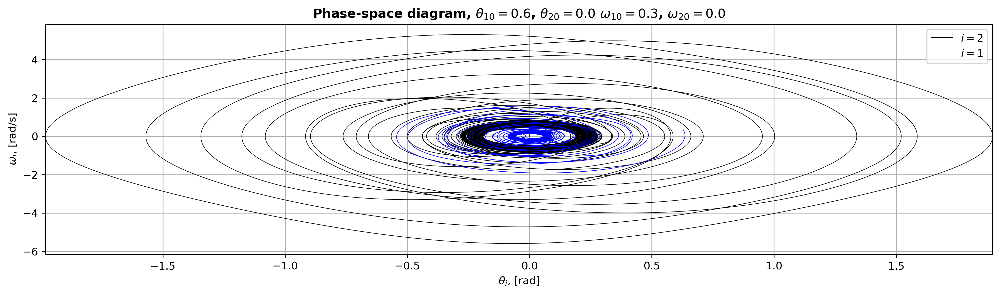

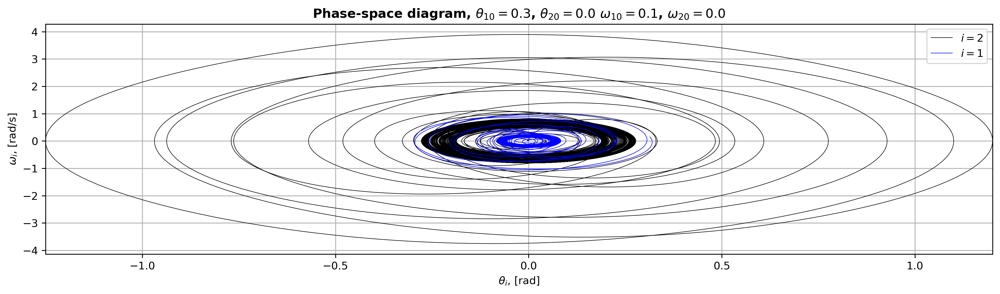

In [29]:
plot_phasespace(double_pendulum_one_theta1, double_pendulum_one_w1, double_pendulum_one_theta2, double_pendulum_one_w2)
plot_phasespace(double_pendulum_two_theta1, double_pendulum_two_w1, double_pendulum_two_theta2, double_pendulum_two_w2)

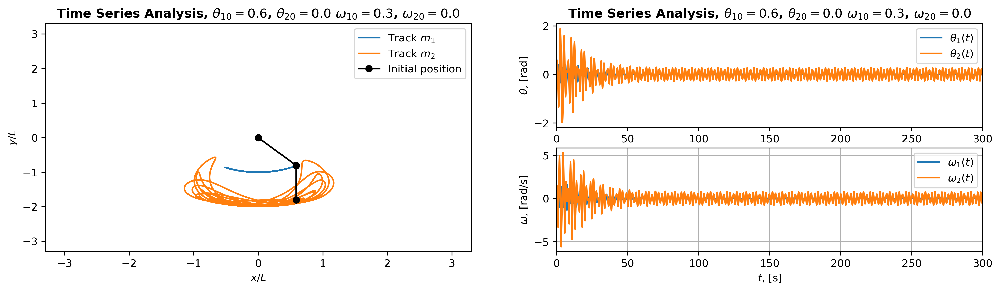

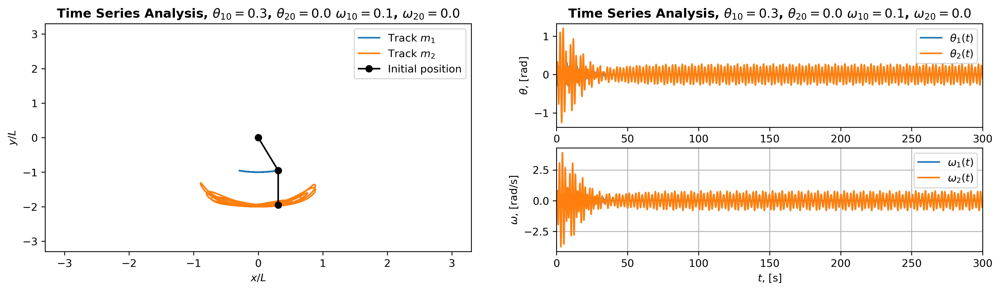

In [30]:
plot_position(x1, y1, x2, y2, double_pendulum_one_theta1, double_pendulum_one_theta2, double_pendulum_one_w1, double_pendulum_one_w2, time)
plot_position(x1_new, y1_new, x2_new, y2_new, double_pendulum_two_theta1, double_pendulum_two_theta2, double_pendulum_two_w1, double_pendulum_two_w2, time)

In [38]:
def plot_thetadifference(theta1, theta1_second, theta2, theta2_second, t):
    difference = theta1 - theta1_second
    difference += np.pi
    difference %= 2 * np.pi
    difference -= np.pi
    difference2 = theta2 - theta2_second
    difference2 += np.pi
    difference2 %= 2 * np.pi
    difference2 -= np.pi
    standard_deviation_threshhold = 0.001
    first_standard_deviation_values = []
    second_standard_deviation_values = []
    first_coupling_location_index = 0
    second_coupling_location_index = 0
    first_standard_deviation_point_made = False
    second_standard_deviation_point_made = False
    for difference_index in range(0, len(difference)):
        first_standard_deviation = np.std(
            difference[difference_index - 100 : difference_index]
        )
        first_standard_deviation_values.append(first_standard_deviation)
        second_standard_deviation = np.std(
            difference2[difference_index - 100 : difference_index]
        )
        second_standard_deviation_values.append(second_standard_deviation)
        if (
            (first_standard_deviation) < standard_deviation_threshhold
            and first_standard_deviation_point_made is False
        ):
            first_coupling_location_index = first_standard_deviation_values.index(
                first_standard_deviation
            )
            first_standard_deviation_point_made = True
        if (
            (second_standard_deviation) < standard_deviation_threshhold
            and second_standard_deviation_point_made is False
        ):
            second_coupling_location_index = second_standard_deviation_values.index(
                second_standard_deviation
            )
            second_standard_deviation_point_made = True
    
    plt.figure(figsize=(6 * figsize, 4 * figsize), dpi=dpi)
    plt.subplot(2, 2, 1)
    plt.plot(t, first_standard_deviation_values, color="green")
    plt.grid()
    if first_coupling_location_index != 0:
        plt.axhline(y=first_standard_deviation, color="r", linewidth=0.8)
    plt.xticks(fontsize= 8)
    plt.yticks(fontsize= 8)
    plt.ylabel(
        r"$\sigma_1$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize = 10)
    plt.title(r"$\sigma_1$ vs. Time (s)", fontsize=12, fontweight="bold")
    
    plt.subplot(2, 2, 2)
    plt.plot(t, np.log(first_standard_deviation_values), color="green")
    plt.grid()
    plt.ylabel(
        r"$\log(\sigma_1)$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize= 10)
    plt.xticks(fontsize = 8)
    plt.yticks(fontsize = 8)
    plt.title(
        r"$\log(\sigma_1)$ vs. Time (s)", fontsize=12, fontweight="bold"
    )
    plt.subplot(2, 2, 3)
    plt.plot(t, second_standard_deviation_values, color="green")
    plt.grid()
    if second_coupling_location_index != 0:
        plt.axhline(y=second_standard_deviation, color="r", linewidth=0.8)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.ylabel(
        r"$\sigma_2$",
        fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize=10)
    plt.title(r"$\sigma_2$ vs. Time (s)", fontsize=12, fontweight="bold")
    
    plt.subplot(2, 2, 4)
    plt.grid()
    plt.plot(t, np.log(second_standard_deviation_values), color="green")
    plt.ylabel(
        r"$\log(\sigma_2)$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize=10)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.title(
        r"$\log(\sigma_2)$ vs. Time (s)", fontsize=12, fontweight="bold"
    )
    plt.suptitle(
        r"$m_{1_1}$"
        + " = "
        + f"{m1_1}"
        + ", "
        + r"$m_{2_1}$"
        + " = "
        + f"{m2_1}"
        + ", "
        + r"$m_{1_2}$"
        + " = "
        + f"{m1_2}"
        + ", "
        + r"$m_{2_2}$"
        + " = "
        + f"{m2_2} "
        + ", "
        + r"$L_{1_1}$"
        + " = "
        + f"{L1_1}"
        + ", "
        + r"$L_{2_1}$"
        + " = "
        + f"{L2_1}"
        + ", "
        + r"$L_{1_2}$"
        + " = "
        + f"{L1_2}"
        + ", "
        + r"$L_{2_2}$"
        + " = "
        + f"{L2_2}"
        + "\n"
        + r"$\theta_{1_1}$"
        + " = "
        + f"{z0_str[0]}"
        + ", "
        + r"$\omega_{1_1}$"
        + " = "
        + f"{z0_str[1]}"
        + ", "
        + r"$\theta_{2_1}$"
        + " = "
        + f"{z0_str[2]}"
        + ", "
        + r"$\omega_{2_1}$"
        + " = "
        + f"{z0_str[3]}"
        + ", "
        + r"$\theta_{1_2}$"
        + " = "
        + f"{z0_str[4]}"
        + ", "
        + r"$\omega_{1_2}$"
        + " = "
        + f"{z0_str[5]}"
        + ", "
        + r"$\theta_{2_2}$"
        + " = "
        + f"{z0_str[6]}"
        + ", "
        + r"$\omega_{2_2}$"
        + " = "
        + f"{z0_str[7]}"
        + "\n"
        + r"K"
        + " = "
        + f"{coupling_strength_K}"
        + ", "
        + r"$\sigma_T$"
        + " = "
        + f"{standard_deviation_threshhold}",
    )
    plt.subplots_adjust(left=0.12,
                    bottom=0.11,
                    right=0.929,
                    top=0.8,
                    wspace=0.407,
                    hspace=0.562)
    plt.tight_layout(pad=15)
    plt.savefig("plots/double-pendulum-synchronization-std-deviation_t3.pdf", dpi=300)
    plt.show()
    
    plt.figure(figsize=(4 * figsize, 3 * figsize), dpi=dpi)
    plt.subplot(1, 2, 1)
    plt.plot(t, difference, color="green")
    plt.grid()
    if first_coupling_location_index != 0:
        plt.axvline(x=t[first_coupling_location_index], color="r")
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel(r"Time (s)", fontsize=8, labelpad=12)
    plt.ylabel(r"$\theta_{1_1}$- $\theta_{1_2}$ (rad)", fontsize=12)
    plt.title(
        r"$\theta_{1_1}$- $\theta_{1_2}$ (rad) vs. Time (s)",
        fontsize=14,
    )
    plt.subplot(1, 2, 2)
    plt.plot(t, difference2, color="green")
    plt.grid()
    if second_coupling_location_index != 0:
        plt.axvline(x=t[second_coupling_location_index], color="r")
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel(r"Time (s)", fontsize=8, labelpad=12)
    plt.ylabel(r"$\theta_{2_1}$- $\theta_{2_2}$ (rad)", fontsize=12)
    plt.title(
        r"$\theta_{2_1}$- $\theta_{2_2}$ (rad) vs. Time (s)",
        fontsize=14,
    )
    plt.suptitle(
        r"$m_{1_1}$"
        + " = "
        + f"{m1_1}"
        + ", "
        + r"$m_{2_1}$"
        + " = "
        + f"{m2_1}"
        + ", "
        + r"$m_{1_2}$"
        + " = "
        + f"{m1_2}"
        + ", "
        + r"$m_{2_2}$"
        + " = "
        + f"{m2_2} "
        + ", "
        + r"$L_{1_1}$"
        + " = "
        + f"{L1_1}"
        + ", "
        + r"$L_{2_1}$"
        + " = "
        + f"{L2_1}"
        + ", "
        + r"$L_{1_2}$"
        + " = "
        + f"{L1_2}"
        + ", "
        + r"$L_{2_2}$"
        + " = "
        + f"{L2_2}"
        + "\n"
        + r"$\theta_{1_1}$"
        + " = "
        + f"{z0_str[0]}"
        + ", "
        + r"$\omega_{1_1}$"
        + " = "
        + f"{z0_str[1]}"
        + ", "
        + r"$\theta_{2_1}$"
        + " = "
        + f"{z0_str[2]}"
        + ", "
        + r"$\omega_{2_1}$"
        + " = "
        + f"{z0_str[3]}"
        + ", "
        + r"$\theta_{1_2}$"
        + " = "
        + f"{z0_str[4]}"
        + ", "
        + r"$\omega_{1_2}$"
        + " = "
        + f"{z0_str[5]}"
        + ", "
        + r"$\theta_{2_2}$"
        + " = "
        + f"{z0_str[6]}"
        + ", "
        + r"$\omega_{2_2}$"
        + " = "
        + f"{z0_str[7]}"
        + "\n"
        + r"K"
        + " = "
        + f"{coupling_strength_K}"
        + ", "
        + r"$\sigma_T$"
        + " = "
        + f"{standard_deviation_threshhold}",
    )
    plt.subplots_adjust(top=0.77)
    plt.savefig("plots/double-pendulum-synchronization-theta-difference_t3.pdf", dpi=300)
    plt.show()

c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:223: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:257: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
<ipython-input-38-84bbbab813ff>:174: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  plt.tight_layout(pad=15)


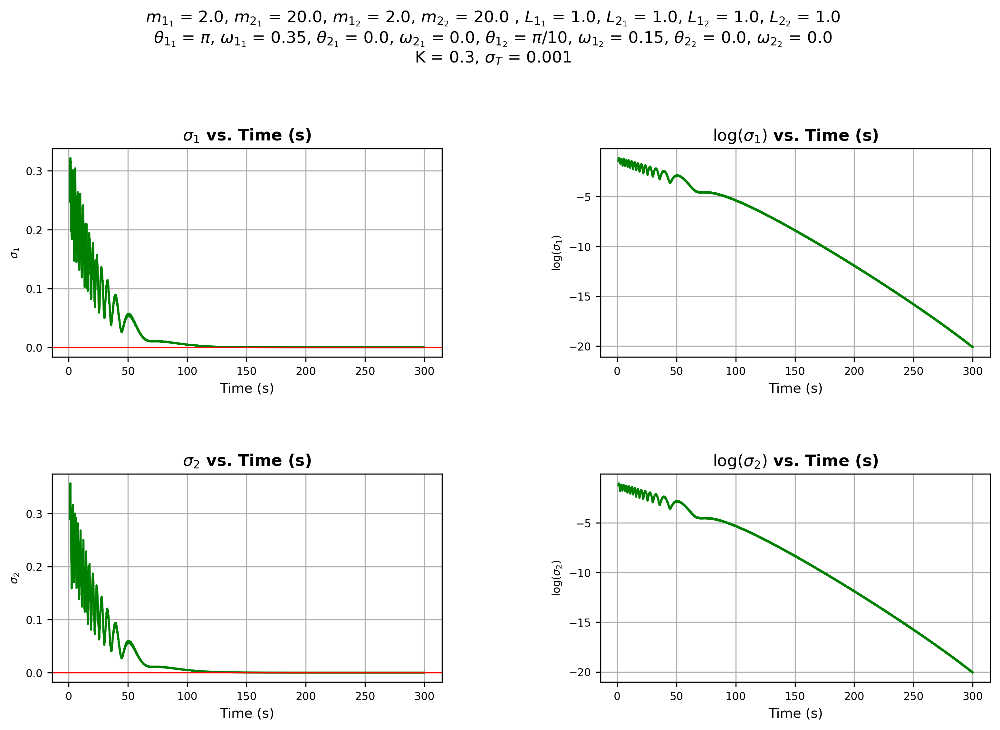

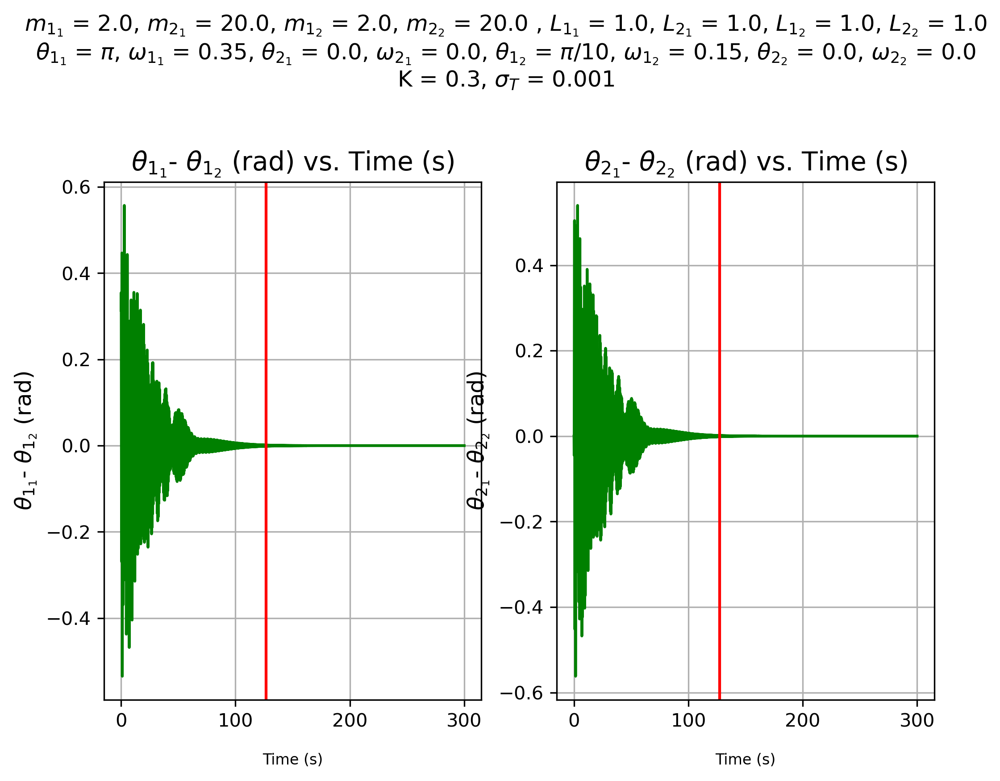

In [39]:
plot_thetadifference(
    double_pendulum_one_theta1,
    double_pendulum_two_theta1,
    double_pendulum_one_theta2,
    double_pendulum_two_theta2,
    time,
)

In [40]:
figsize = 2
dpi = 300
g = 9.81
pi = np.pi
# First double pendulum
L1_1 = 1.0
L2_1 = 1.0
m1_1 = 2.0
m2_1 = 1 / 5 
# Second double pendulum
L1_2 = 1.0
L2_2 = 1.0
m1_2 = 2.0
m2_2 = 1 / 5
# Initial first double pendulum configuration
first_double_pendulum_configuration = [pi, 0.35, 0.0, 0.0]
# Initial second double pendulum configuration
second_double_pendulum_configuration = [pi / 10, 0.15, 0.0, 0.0]
# Initial double pendulum system configuration
z0 = [*first_double_pendulum_configuration, *second_double_pendulum_configuration]
z0_str = [
    rf"$\pi$",
    rf"${z0[1]}$",
    rf"${z0[2]}$",
    rf"${z0[3]}$",
    rf"$\pi/10$",
    rf"${z0[5]}$",
    rf"${z0[6]}$",
    rf"${z0[7]}$",
]
# System constants
coupling_strength_K = 0.3
number_of_pendulums = int(len(z0) / 4)
# Time interval configuration
time_start = 0
time_stop = 300
time_step = 0.01
time = np.arange(time_start, time_stop + time_step, time_step)
# Numerical integration
z = integrate.odeint(
    double_pendulum_computations,
    z0,
    time,
    args=(
        L1_1,
        L2_1,
        L1_2,
        L2_2,
        m1_1,
        m2_1,
        m1_2,
        m2_2,
        g,
        coupling_strength_K,
        number_of_pendulums,
    ),
)

(
    double_pendulum_one_theta1,
    double_pendulum_one_w1,
    double_pendulum_one_theta2,
    double_pendulum_one_w2,
) = (z[:, 0], z[:, 1], z[:, 2], z[:, 3])
(
    double_pendulum_two_theta1,
    double_pendulum_two_w1,
    double_pendulum_two_theta2,
    double_pendulum_two_w2,
) = (z[:, 4], z[:, 5], z[:, 6], z[:, 7])

x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(
    double_pendulum_one_theta1,
    double_pendulum_one_w1,
    double_pendulum_one_theta2,
    double_pendulum_one_w2,
    L1_1,
    L2_1,
)
x1_new, y1_new, x2_new, y2_new, vx1_new, vy1_new, vx2_new, vy2_new = to_cartesian(
    double_pendulum_two_theta1,
    double_pendulum_two_w1,
    double_pendulum_two_theta2,
    double_pendulum_two_w2,
    L1_2,
    L2_2,
)

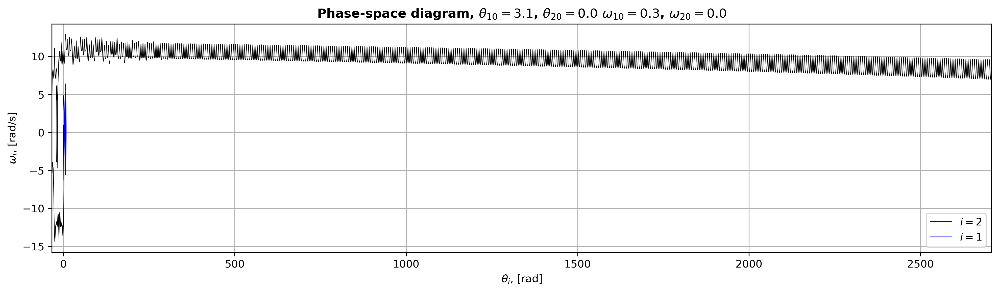

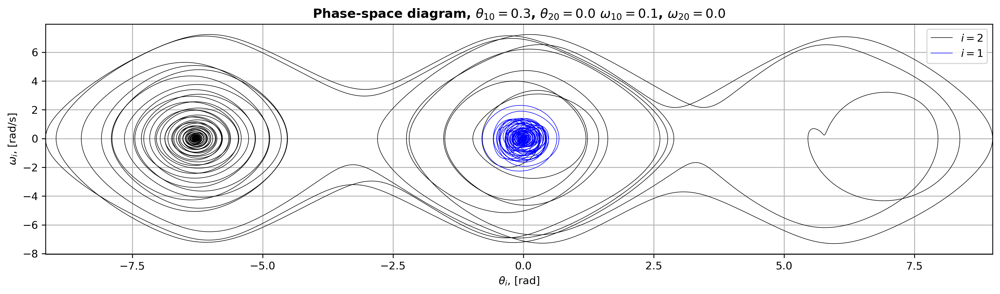

In [34]:
plot_phasespace(double_pendulum_one_theta1, double_pendulum_one_w1, double_pendulum_one_theta2, double_pendulum_one_w2)
plot_phasespace(double_pendulum_two_theta1, double_pendulum_two_w1, double_pendulum_two_theta2, double_pendulum_two_w2)

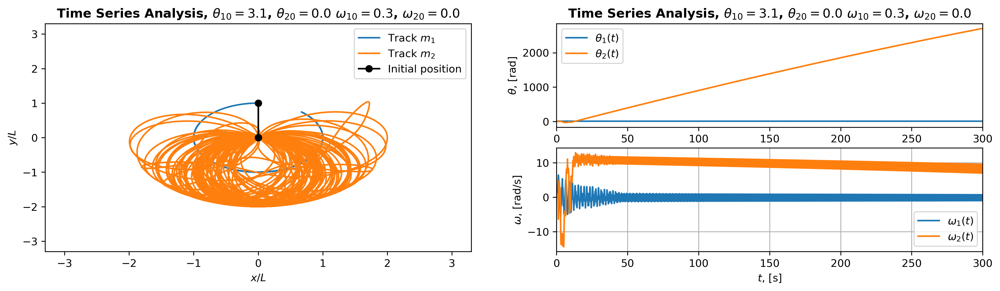

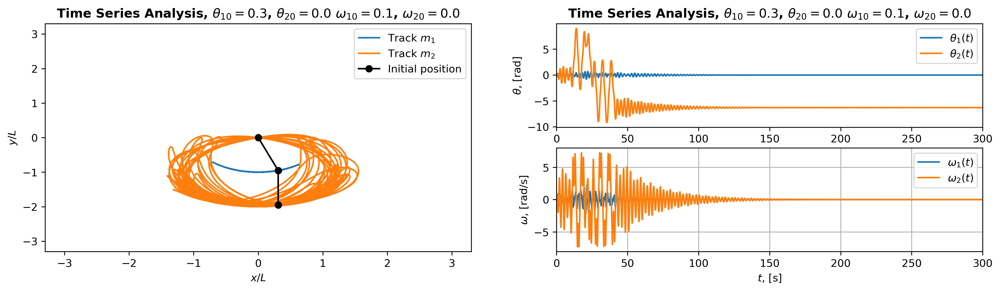

In [35]:
plot_position(x1, y1, x2, y2, double_pendulum_one_theta1, double_pendulum_one_theta2, double_pendulum_one_w1, double_pendulum_one_w2, time)
plot_position(x1_new, y1_new, x2_new, y2_new, double_pendulum_two_theta1, double_pendulum_two_theta2, double_pendulum_two_w1, double_pendulum_two_w2, time)

In [41]:
def plot_thetadifference(theta1, theta1_second, theta2, theta2_second, t):
    difference = theta1 - theta1_second
    difference += np.pi
    difference %= 2 * np.pi
    difference -= np.pi
    difference2 = theta2 - theta2_second
    difference2 += np.pi
    difference2 %= 2 * np.pi
    difference2 -= np.pi
    standard_deviation_threshhold = 0.001
    first_standard_deviation_values = []
    second_standard_deviation_values = []
    first_coupling_location_index = 0
    second_coupling_location_index = 0
    first_standard_deviation_point_made = False
    second_standard_deviation_point_made = False
    for difference_index in range(0, len(difference)):
        first_standard_deviation = np.std(
            difference[difference_index - 100 : difference_index]
        )
        first_standard_deviation_values.append(first_standard_deviation)
        second_standard_deviation = np.std(
            difference2[difference_index - 100 : difference_index]
        )
        second_standard_deviation_values.append(second_standard_deviation)
        if (
            (first_standard_deviation) < standard_deviation_threshhold
            and first_standard_deviation_point_made is False
        ):
            first_coupling_location_index = first_standard_deviation_values.index(
                first_standard_deviation
            )
            first_standard_deviation_point_made = True
        if (
            (second_standard_deviation) < standard_deviation_threshhold
            and second_standard_deviation_point_made is False
        ):
            second_coupling_location_index = second_standard_deviation_values.index(
                second_standard_deviation
            )
            second_standard_deviation_point_made = True
    
    plt.figure(figsize=(6 * figsize, 4 * figsize), dpi=dpi)
    plt.subplot(2, 2, 1)
    plt.plot(t, first_standard_deviation_values, color="green")
    plt.grid()
    if first_coupling_location_index != 0:
        plt.axhline(y=first_standard_deviation, color="r", linewidth=0.8)
    plt.xticks(fontsize= 8)
    plt.yticks(fontsize= 8)
    plt.ylabel(
        r"$\sigma_1$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize = 10)
    plt.title(r"$\sigma_1$ vs. Time (s)", fontsize=12, fontweight="bold")
    
    plt.subplot(2, 2, 2)
    plt.plot(t, np.log(first_standard_deviation_values), color="green")
    plt.grid()
    plt.ylabel(
        r"$\log(\sigma_1)$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize= 10)
    plt.xticks(fontsize = 8)
    plt.yticks(fontsize = 8)
    plt.title(
        r"$\log(\sigma_1)$ vs. Time (s)", fontsize=12, fontweight="bold"
    )
    plt.subplot(2, 2, 3)
    plt.plot(t, second_standard_deviation_values, color="green")
    plt.grid()
    if second_coupling_location_index != 0:
        plt.axhline(y=second_standard_deviation, color="r", linewidth=0.8)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.ylabel(
        r"$\sigma_2$",
        fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize=10)
    plt.title(r"$\sigma_2$ vs. Time (s)", fontsize=12, fontweight="bold")
    
    plt.subplot(2, 2, 4)
    plt.grid()
    plt.plot(t, np.log(second_standard_deviation_values), color="green")
    plt.ylabel(
        r"$\log(\sigma_2)$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize=10)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.title(
        r"$\log(\sigma_2)$ vs. Time (s)", fontsize=12, fontweight="bold"
    )
    plt.suptitle(
        r"$m_{1_1}$"
        + " = "
        + f"{m1_1}"
        + ", "
        + r"$m_{2_1}$"
        + " = "
        + f"{m2_1}"
        + ", "
        + r"$m_{1_2}$"
        + " = "
        + f"{m1_2}"
        + ", "
        + r"$m_{2_2}$"
        + " = "
        + f"{m2_2} "
        + ", "
        + r"$L_{1_1}$"
        + " = "
        + f"{L1_1}"
        + ", "
        + r"$L_{2_1}$"
        + " = "
        + f"{L2_1}"
        + ", "
        + r"$L_{1_2}$"
        + " = "
        + f"{L1_2}"
        + ", "
        + r"$L_{2_2}$"
        + " = "
        + f"{L2_2}"
        + "\n"
        + r"$\theta_{1_1}$"
        + " = "
        + f"{z0_str[0]}"
        + ", "
        + r"$\omega_{1_1}$"
        + " = "
        + f"{z0_str[1]}"
        + ", "
        + r"$\theta_{2_1}$"
        + " = "
        + f"{z0_str[2]}"
        + ", "
        + r"$\omega_{2_1}$"
        + " = "
        + f"{z0_str[3]}"
        + ", "
        + r"$\theta_{1_2}$"
        + " = "
        + f"{z0_str[4]}"
        + ", "
        + r"$\omega_{1_2}$"
        + " = "
        + f"{z0_str[5]}"
        + ", "
        + r"$\theta_{2_2}$"
        + " = "
        + f"{z0_str[6]}"
        + ", "
        + r"$\omega_{2_2}$"
        + " = "
        + f"{z0_str[7]}"
        + "\n"
        + r"K"
        + " = "
        + f"{coupling_strength_K}"
        + ", "
        + r"$\sigma_T$"
        + " = "
        + f"{standard_deviation_threshhold}",
    )
    plt.subplots_adjust(left=0.12,
                    bottom=0.11,
                    right=0.929,
                    top=0.8,
                    wspace=0.407,
                    hspace=0.562)
    plt.tight_layout(pad=15)
    plt.savefig("plots/double-pendulum-synchronization-std-deviation_t4.pdf", dpi=300)
    plt.show()
    
    plt.figure(figsize=(4 * figsize, 3 * figsize), dpi=dpi)
    plt.subplot(1, 2, 1)
    plt.plot(t, difference, color="green")
    plt.grid()
    if first_coupling_location_index != 0:
        plt.axvline(x=t[first_coupling_location_index], color="r")
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel(r"Time (s)", fontsize=8, labelpad=12)
    plt.ylabel(r"$\theta_{1_1}$- $\theta_{1_2}$ (rad)", fontsize=12)
    plt.title(
        r"$\theta_{1_1}$- $\theta_{1_2}$ (rad) vs. Time (s)",
        fontsize=14,
    )
    plt.subplot(1, 2, 2)
    plt.plot(t, difference2, color="green")
    plt.grid()
    if second_coupling_location_index != 0:
        plt.axvline(x=t[second_coupling_location_index], color="r")
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel(r"Time (s)", fontsize=8, labelpad=12)
    plt.ylabel(r"$\theta_{2_1}$- $\theta_{2_2}$ (rad)", fontsize=12)
    plt.title(
        r"$\theta_{2_1}$- $\theta_{2_2}$ (rad) vs. Time (s)",
        fontsize=14,
    )
    plt.suptitle(
        r"$m_{1_1}$"
        + " = "
        + f"{m1_1}"
        + ", "
        + r"$m_{2_1}$"
        + " = "
        + f"{m2_1}"
        + ", "
        + r"$m_{1_2}$"
        + " = "
        + f"{m1_2}"
        + ", "
        + r"$m_{2_2}$"
        + " = "
        + f"{m2_2} "
        + ", "
        + r"$L_{1_1}$"
        + " = "
        + f"{L1_1}"
        + ", "
        + r"$L_{2_1}$"
        + " = "
        + f"{L2_1}"
        + ", "
        + r"$L_{1_2}$"
        + " = "
        + f"{L1_2}"
        + ", "
        + r"$L_{2_2}$"
        + " = "
        + f"{L2_2}"
        + "\n"
        + r"$\theta_{1_1}$"
        + " = "
        + f"{z0_str[0]}"
        + ", "
        + r"$\omega_{1_1}$"
        + " = "
        + f"{z0_str[1]}"
        + ", "
        + r"$\theta_{2_1}$"
        + " = "
        + f"{z0_str[2]}"
        + ", "
        + r"$\omega_{2_1}$"
        + " = "
        + f"{z0_str[3]}"
        + ", "
        + r"$\theta_{1_2}$"
        + " = "
        + f"{z0_str[4]}"
        + ", "
        + r"$\omega_{1_2}$"
        + " = "
        + f"{z0_str[5]}"
        + ", "
        + r"$\theta_{2_2}$"
        + " = "
        + f"{z0_str[6]}"
        + ", "
        + r"$\omega_{2_2}$"
        + " = "
        + f"{z0_str[7]}"
        + "\n"
        + r"K"
        + " = "
        + f"{coupling_strength_K}"
        + ", "
        + r"$\sigma_T$"
        + " = "
        + f"{standard_deviation_threshhold}",
    )
    plt.subplots_adjust(top=0.77)
    plt.savefig("plots/double-pendulum-synchronization-theta-difference_t4.pdf", dpi=300)
    plt.show()

c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:223: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:257: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
<ipython-input-41-e539542e606f>:174: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  plt.tight_layout(pad=15)


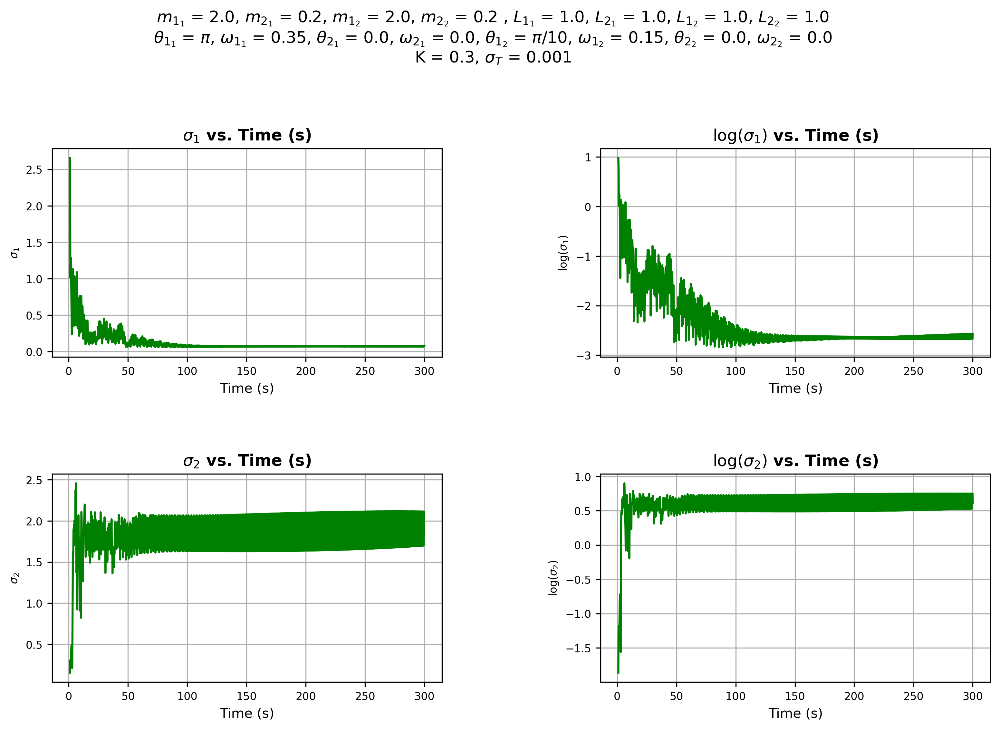

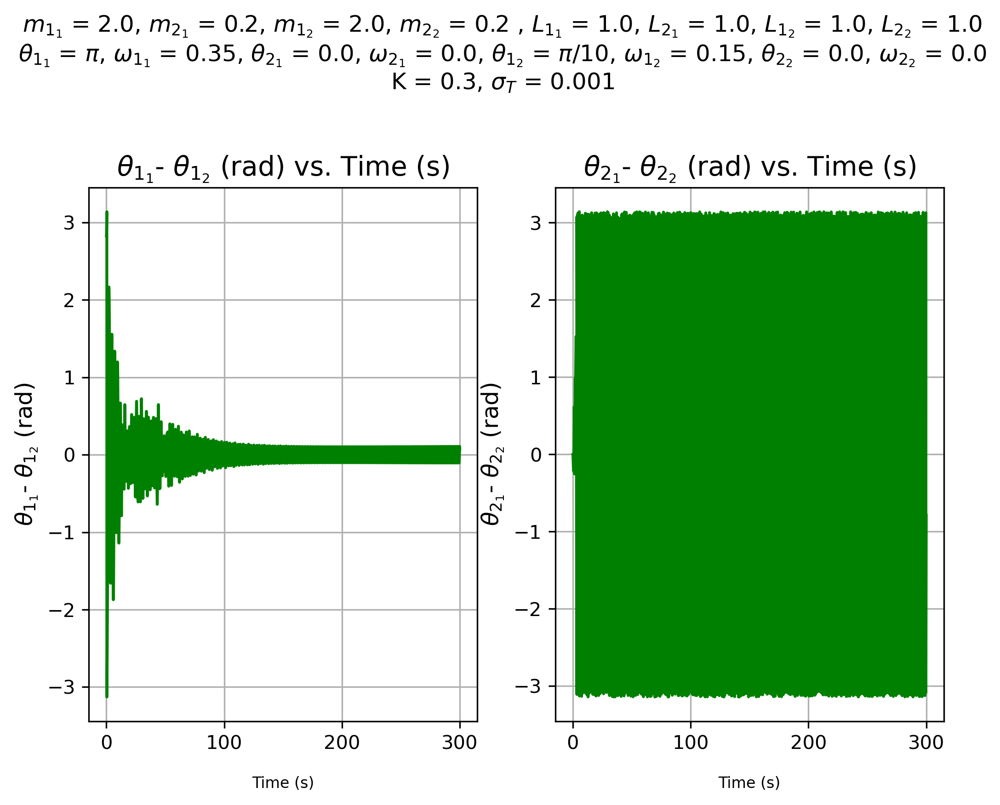

In [42]:
plot_thetadifference(
    double_pendulum_one_theta1,
    double_pendulum_two_theta1,
    double_pendulum_one_theta2,
    double_pendulum_two_theta2,
    time,
)

In [43]:
figsize = 2
dpi = 300
g = 9.81
pi = np.pi
# First double pendulum
L1_1 = 1.0
L2_1 = 1.0
m1_1 = 2.0
m2_1 = 1 / 5
# Second double pendulum
L1_2 = 1.0
L2_2 = 1.0
m1_2 = 2.0
m2_2 = 1 / 5
# Initial first double pendulum configuration
first_double_pendulum_configuration = [pi, 2.35, 0.0, 0.0]
# Initial second double pendulum configuration
second_double_pendulum_configuration = [pi / 10, 0.15, 0.0, 0.0]
# Initial double pendulum system configuration
z0 = [*first_double_pendulum_configuration, *second_double_pendulum_configuration]
z0_str = [
    rf"$\pi$",
    rf"${z0[1]}$",
    rf"${z0[2]}$",
    rf"${z0[3]}$",
    rf"$\pi/10$",
    rf"${z0[5]}$",
    rf"${z0[6]}$",
    rf"${z0[7]}$",
]
# System constants
coupling_strength_K = 0.3
number_of_pendulums = int(len(z0) / 4)
# Time interval configuration
time_start = 0
time_stop = 300
time_step = 0.01
time = np.arange(time_start, time_stop + time_step, time_step)
# Numerical integration
z = integrate.odeint(
    double_pendulum_computations,
    z0,
    time,
    args=(
        L1_1,
        L2_1,
        L1_2,
        L2_2,
        m1_1,
        m2_1,
        m1_2,
        m2_2,
        g,
        coupling_strength_K,
        number_of_pendulums,
    ),
)

(
    double_pendulum_one_theta1,
    double_pendulum_one_w1,
    double_pendulum_one_theta2,
    double_pendulum_one_w2,
) = (z[:, 0], z[:, 1], z[:, 2], z[:, 3])
(
    double_pendulum_two_theta1,
    double_pendulum_two_w1,
    double_pendulum_two_theta2,
    double_pendulum_two_w2,
) = (z[:, 4], z[:, 5], z[:, 6], z[:, 7])

x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(
    double_pendulum_one_theta1,
    double_pendulum_one_w1,
    double_pendulum_one_theta2,
    double_pendulum_one_w2,
    L1_1,
    L2_1,
)
x1_new, y1_new, x2_new, y2_new, vx1_new, vy1_new, vx2_new, vy2_new = to_cartesian(
    double_pendulum_two_theta1,
    double_pendulum_two_w1,
    double_pendulum_two_theta2,
    double_pendulum_two_w2,
    L1_2,
    L2_2,
)

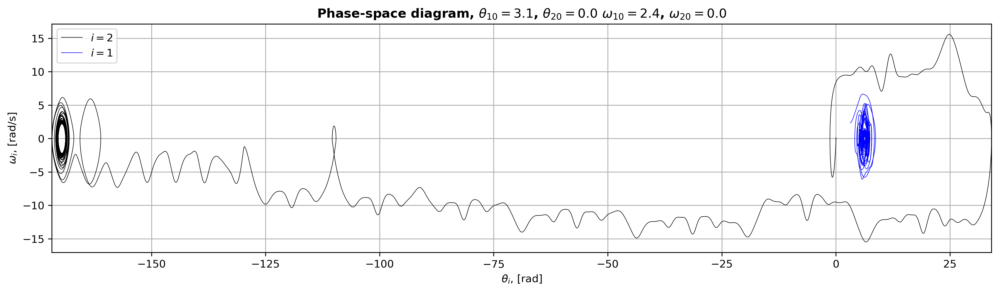

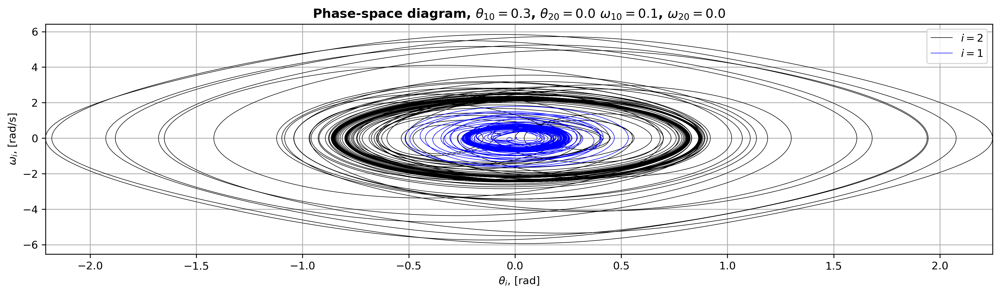

In [42]:
plot_phasespace(double_pendulum_one_theta1, double_pendulum_one_w1, double_pendulum_one_theta2, double_pendulum_one_w2)
plot_phasespace(double_pendulum_two_theta1, double_pendulum_two_w1, double_pendulum_two_theta2, double_pendulum_two_w2)

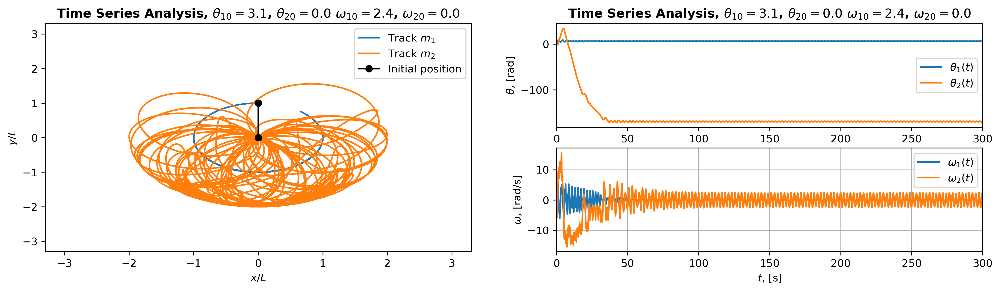

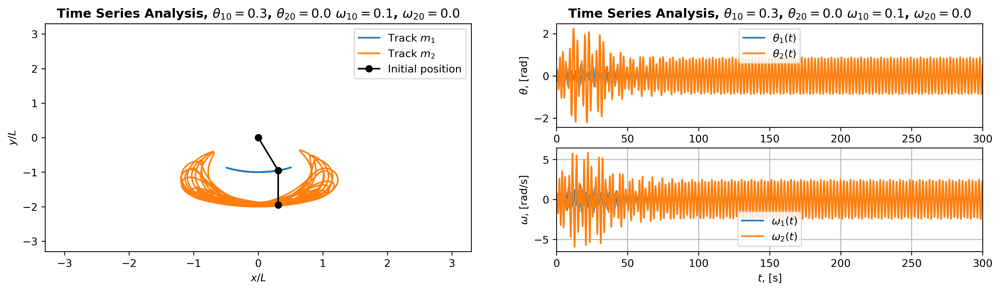

In [43]:
plot_position(x1, y1, x2, y2, double_pendulum_one_theta1, double_pendulum_one_theta2, double_pendulum_one_w1, double_pendulum_one_w2, time)
plot_position(x1_new, y1_new, x2_new, y2_new, double_pendulum_two_theta1, double_pendulum_two_theta2, double_pendulum_two_w1, double_pendulum_two_w2, time)

In [44]:
def plot_thetadifference(theta1, theta1_second, theta2, theta2_second, t):
    difference = theta1 - theta1_second
    difference += np.pi
    difference %= 2 * np.pi
    difference -= np.pi
    difference2 = theta2 - theta2_second
    difference2 += np.pi
    difference2 %= 2 * np.pi
    difference2 -= np.pi
    standard_deviation_threshhold = 0.001
    first_standard_deviation_values = []
    second_standard_deviation_values = []
    first_coupling_location_index = 0
    second_coupling_location_index = 0
    first_standard_deviation_point_made = False
    second_standard_deviation_point_made = False
    for difference_index in range(0, len(difference)):
        first_standard_deviation = np.std(
            difference[difference_index - 100 : difference_index]
        )
        first_standard_deviation_values.append(first_standard_deviation)
        second_standard_deviation = np.std(
            difference2[difference_index - 100 : difference_index]
        )
        second_standard_deviation_values.append(second_standard_deviation)
        if (
            (first_standard_deviation) < standard_deviation_threshhold
            and first_standard_deviation_point_made is False
        ):
            first_coupling_location_index = first_standard_deviation_values.index(
                first_standard_deviation
            )
            first_standard_deviation_point_made = True
        if (
            (second_standard_deviation) < standard_deviation_threshhold
            and second_standard_deviation_point_made is False
        ):
            second_coupling_location_index = second_standard_deviation_values.index(
                second_standard_deviation
            )
            second_standard_deviation_point_made = True
    
    plt.figure(figsize=(6 * figsize, 4 * figsize), dpi=dpi)
    plt.subplot(2, 2, 1)
    plt.plot(t, first_standard_deviation_values, color="green")
    plt.grid()
    if first_coupling_location_index != 0:
        plt.axhline(y=first_standard_deviation, color="r", linewidth=0.8)
    plt.xticks(fontsize= 8)
    plt.yticks(fontsize= 8)
    plt.ylabel(
        r"$\sigma_1$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize = 10)
    plt.title(r"$\sigma_1$ vs. Time (s)", fontsize=12, fontweight="bold")
    
    plt.subplot(2, 2, 2)
    plt.plot(t, np.log(first_standard_deviation_values), color="green")
    plt.grid()
    plt.ylabel(
        r"$\log(\sigma_1)$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize= 10)
    plt.xticks(fontsize = 8)
    plt.yticks(fontsize = 8)
    plt.title(
        r"$\log(\sigma_1)$ vs. Time (s)", fontsize=12, fontweight="bold"
    )
    plt.subplot(2, 2, 3)
    plt.plot(t, second_standard_deviation_values, color="green")
    plt.grid()
    if second_coupling_location_index != 0:
        plt.axhline(y=second_standard_deviation, color="r", linewidth=0.8)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.ylabel(
        r"$\sigma_2$",
        fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize=10)
    plt.title(r"$\sigma_2$ vs. Time (s)", fontsize=12, fontweight="bold")
    
    plt.subplot(2, 2, 4)
    plt.grid()
    plt.plot(t, np.log(second_standard_deviation_values), color="green")
    plt.ylabel(
        r"$\log(\sigma_2)$", fontsize= 8
    )
    plt.xlabel("Time (s)", fontsize=10)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.title(
        r"$\log(\sigma_2)$ vs. Time (s)", fontsize=12, fontweight="bold"
    )
    plt.suptitle(
        r"$m_{1_1}$"
        + " = "
        + f"{m1_1}"
        + ", "
        + r"$m_{2_1}$"
        + " = "
        + f"{m2_1}"
        + ", "
        + r"$m_{1_2}$"
        + " = "
        + f"{m1_2}"
        + ", "
        + r"$m_{2_2}$"
        + " = "
        + f"{m2_2} "
        + ", "
        + r"$L_{1_1}$"
        + " = "
        + f"{L1_1}"
        + ", "
        + r"$L_{2_1}$"
        + " = "
        + f"{L2_1}"
        + ", "
        + r"$L_{1_2}$"
        + " = "
        + f"{L1_2}"
        + ", "
        + r"$L_{2_2}$"
        + " = "
        + f"{L2_2}"
        + "\n"
        + r"$\theta_{1_1}$"
        + " = "
        + f"{z0_str[0]}"
        + ", "
        + r"$\omega_{1_1}$"
        + " = "
        + f"{z0_str[1]}"
        + ", "
        + r"$\theta_{2_1}$"
        + " = "
        + f"{z0_str[2]}"
        + ", "
        + r"$\omega_{2_1}$"
        + " = "
        + f"{z0_str[3]}"
        + ", "
        + r"$\theta_{1_2}$"
        + " = "
        + f"{z0_str[4]}"
        + ", "
        + r"$\omega_{1_2}$"
        + " = "
        + f"{z0_str[5]}"
        + ", "
        + r"$\theta_{2_2}$"
        + " = "
        + f"{z0_str[6]}"
        + ", "
        + r"$\omega_{2_2}$"
        + " = "
        + f"{z0_str[7]}"
        + "\n"
        + r"K"
        + " = "
        + f"{coupling_strength_K}"
        + ", "
        + r"$\sigma_T$"
        + " = "
        + f"{standard_deviation_threshhold}",
    )
    plt.subplots_adjust(left=0.12,
                    bottom=0.11,
                    right=0.929,
                    top=0.8,
                    wspace=0.407,
                    hspace=0.562)
    plt.tight_layout(pad=15)
    plt.savefig("plots/double-pendulum-synchronization-std-deviation_t5.pdf", dpi=300)
    plt.show()
    
    plt.figure(figsize=(4 * figsize, 3 * figsize), dpi=dpi)
    plt.subplot(1, 2, 1)
    plt.plot(t, difference, color="green")
    plt.grid()
    if first_coupling_location_index != 0:
        plt.axvline(x=t[first_coupling_location_index], color="r")
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel(r"Time (s)", fontsize=8, labelpad=12)
    plt.ylabel(r"$\theta_{1_1}$- $\theta_{1_2}$ (rad)", fontsize=12)
    plt.title(
        r"$\theta_{1_1}$- $\theta_{1_2}$ (rad) vs. Time (s)",
        fontsize=14,
    )
    plt.subplot(1, 2, 2)
    plt.plot(t, difference2, color="green")
    plt.grid()
    if second_coupling_location_index != 0:
        plt.axvline(x=t[second_coupling_location_index], color="r")
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel(r"Time (s)", fontsize=8, labelpad=12)
    plt.ylabel(r"$\theta_{2_1}$- $\theta_{2_2}$ (rad)", fontsize=12)
    plt.title(
        r"$\theta_{2_1}$- $\theta_{2_2}$ (rad) vs. Time (s)",
        fontsize=14,
    )
    plt.suptitle(
        r"$m_{1_1}$"
        + " = "
        + f"{m1_1}"
        + ", "
        + r"$m_{2_1}$"
        + " = "
        + f"{m2_1}"
        + ", "
        + r"$m_{1_2}$"
        + " = "
        + f"{m1_2}"
        + ", "
        + r"$m_{2_2}$"
        + " = "
        + f"{m2_2} "
        + ", "
        + r"$L_{1_1}$"
        + " = "
        + f"{L1_1}"
        + ", "
        + r"$L_{2_1}$"
        + " = "
        + f"{L2_1}"
        + ", "
        + r"$L_{1_2}$"
        + " = "
        + f"{L1_2}"
        + ", "
        + r"$L_{2_2}$"
        + " = "
        + f"{L2_2}"
        + "\n"
        + r"$\theta_{1_1}$"
        + " = "
        + f"{z0_str[0]}"
        + ", "
        + r"$\omega_{1_1}$"
        + " = "
        + f"{z0_str[1]}"
        + ", "
        + r"$\theta_{2_1}$"
        + " = "
        + f"{z0_str[2]}"
        + ", "
        + r"$\omega_{2_1}$"
        + " = "
        + f"{z0_str[3]}"
        + ", "
        + r"$\theta_{1_2}$"
        + " = "
        + f"{z0_str[4]}"
        + ", "
        + r"$\omega_{1_2}$"
        + " = "
        + f"{z0_str[5]}"
        + ", "
        + r"$\theta_{2_2}$"
        + " = "
        + f"{z0_str[6]}"
        + ", "
        + r"$\omega_{2_2}$"
        + " = "
        + f"{z0_str[7]}"
        + "\n"
        + r"K"
        + " = "
        + f"{coupling_strength_K}"
        + ", "
        + r"$\sigma_T$"
        + " = "
        + f"{standard_deviation_threshhold}",
    )
    plt.subplots_adjust(top=0.77)
    plt.savefig("plots/double-pendulum-synchronization-theta-difference_t5.pdf", dpi=300)
    plt.show()

c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:223: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:257: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
<ipython-input-44-4cdfdcc62ca6>:174: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  plt.tight_layout(pad=15)


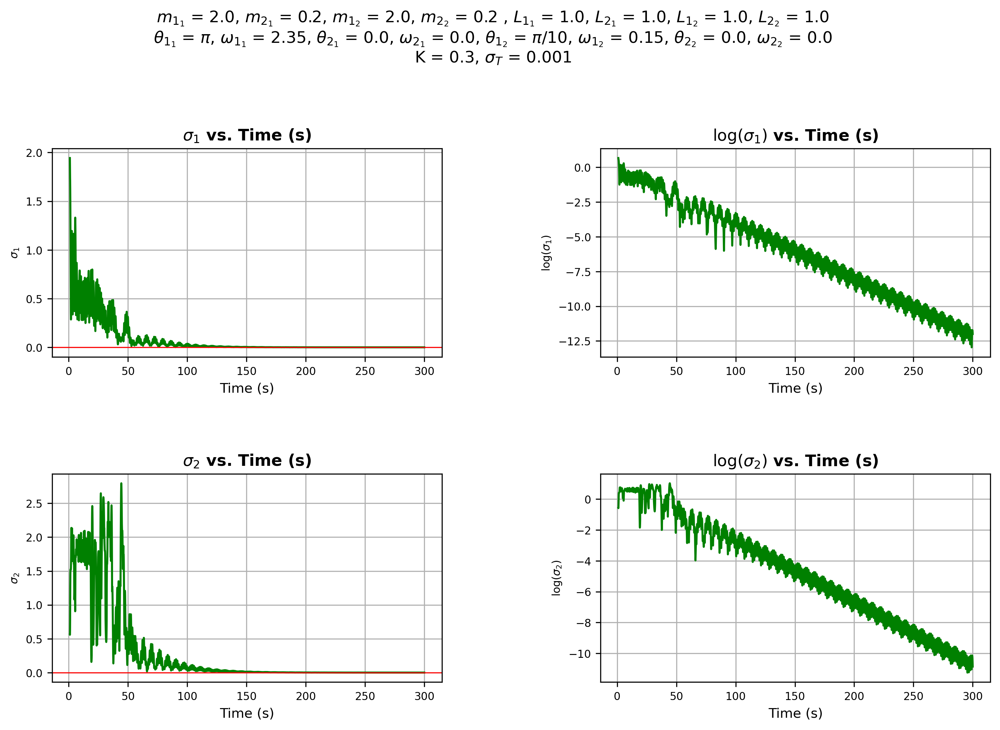

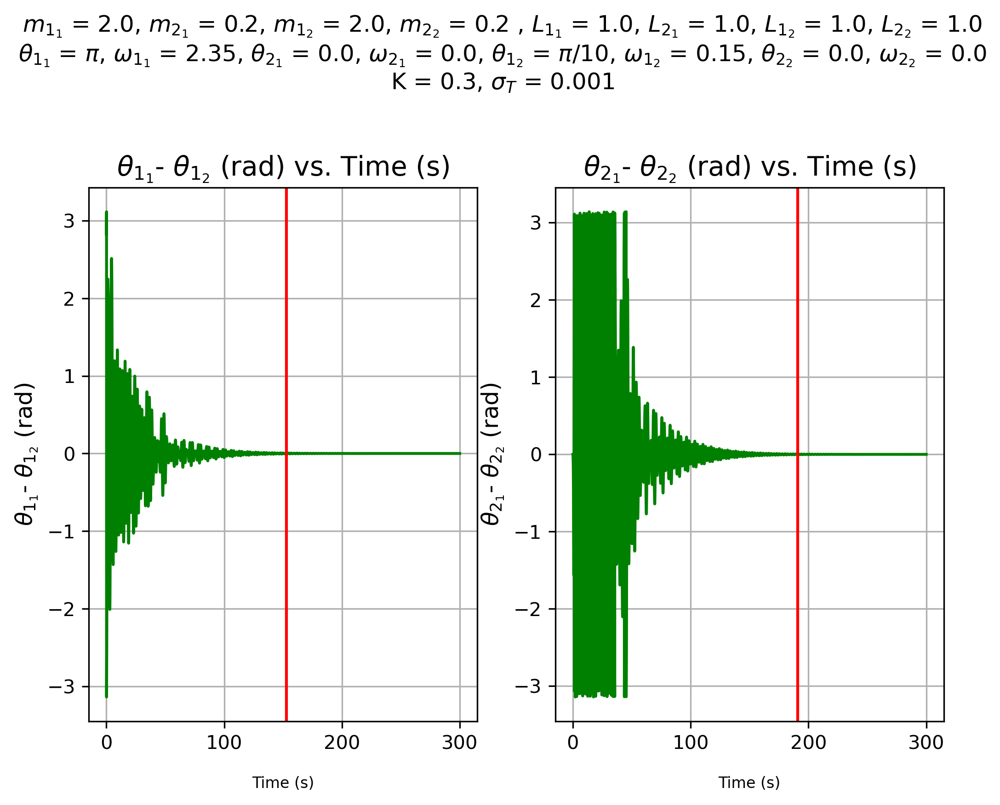

In [45]:
plot_thetadifference(
    double_pendulum_one_theta1,
    double_pendulum_two_theta1,
    double_pendulum_one_theta2,
    double_pendulum_two_theta2,
    time,
)

In [54]:
def double_kuramoto(z, t, L1_1, L2_1, L1_2, L2_2, m1_1, m2_1, m1_2, m2_2, g, K):
    pendulum_values = []
    return_values = []
    num_of_pendulums = int(len(z) / 4)
    pendulum_values.extend(z)
    for i in range(0, num_of_pendulums):
        counter1 = 0
        for j in range(0, num_of_pendulums):
            if i != j:
                counter1 += np.sin(pendulum_values[j * 4] - pendulum_values[i * 4])
        pendulum_values[i * 4 + 1] += (K * counter1) / num_of_pendulums
    for i in range(0, num_of_pendulums):
        L1 = L1_1 if i == 0 else L1_2
        L2 = L2_1 if i == 0 else L2_2
        m1 = m1_1 if i == 0 else m1_2
        m2 = m2_1 if i == 0 else m2_2
        theta1, w1, theta2, w2 = pendulum_values[i * 4 : i * 4 + 4]
        cos12 = np.cos(theta1 - theta2)
        sin12 = np.sin(theta1 - theta2)
        sin1 = np.sin(theta1)
        sin2 = np.sin(theta2)
        xi = cos12**2 * m2 - m1 - m2
        w1dot = (
            L1 * m2 * cos12 * sin12 * w1**2
            + L2 * m2 * sin12 * w2**2
            - m2 * g * cos12 * sin2
            + (m1 + m2) * g * sin1
        ) / (L1 * xi)
        w2dot = -(
            L2 * m2 * cos12 * sin12 * w2**2
            + L1 * (m1 + m2) * sin12 * w1**2
            + (m1 + m2) * g * sin1 * cos12
            - (m1 + m2) * g * sin2
        ) / (L2 * xi)
        return_values.extend([w1, w1dot, w2, w2dot])
    return return_values


In [55]:
def to_cartesian(theta1, w1, theta2, w2, L1, L2):
    x1 = L1 * np.sin(theta1)
    y1 = -L1 * np.cos(theta1)
    x2 = x1 + L2 * np.sin(theta2)
    y2 = y1 - L2 * np.cos(theta2)
    vx1 = L1 * np.cos(theta1) * w1
    vy1 = L1 * np.sin(theta1) * w1
    vx2 = vx1 + L2 * np.cos(theta2) * w2
    vy2 = vy1 + L2 * np.sin(theta2) * w2
    return x1, y1, x2, y2, vx1, vy1, vx2, vy2

In [57]:
def plot_thetadifference(theta1, theta1_second, theta2, theta2_second, t, std_thresh):
    difference = theta1 - theta1_second
    difference += np.pi
    difference %= 2 * np.pi
    difference -= np.pi
    difference2 = theta2 - theta2_second
    difference2 += np.pi
    difference2 %= 2 * np.pi
    difference2 -= np.pi
    standard_deviation_threshold = std_thresh
    first_standard_deviation_values = []
    second_standard_deviation_values = []
    first_coupling_location_index = 0
    second_coupling_location_index = 0
    first_standard_deviation_point_made = False
    second_standard_deviation_point_made = False
    for difference_index in range(0, len(difference)):
        first_standard_deviation = np.std(
            difference[difference_index - 100 : difference_index]
        )
        first_standard_deviation_values.append(first_standard_deviation)
        second_standard_deviation = np.std(
            difference2[difference_index - 100 : difference_index]
        )
        second_standard_deviation_values.append(second_standard_deviation)
        #print(first_standard_deviation)
        if (
            (first_standard_deviation) < standard_deviation_threshold
            and first_standard_deviation_point_made is False
        ):
            first_coupling_location_index = first_standard_deviation_values.index(
                first_standard_deviation
            )
            first_standard_deviation_point_made = True
        if (
            (second_standard_deviation) < standard_deviation_threshold
            and second_standard_deviation_point_made is False
        ):
            second_coupling_location_index = second_standard_deviation_values.index(
                second_standard_deviation
            )
            second_standard_deviation_point_made = True
    first_storage.append(t[first_coupling_location_index])
    second_storage.append(t[second_coupling_location_index])

In [58]:
figsize = 2
dpi = 300
g = 9.81
x_axis_K = []
x_axis_m1_1 = []
x_axis_m2_1 = []
x_axis_m1_2 = []
x_axis_m2_2 = []
first_storage = []
second_storage = []
standard_deviation_threshold = 0.001

i = 0.00
while i < 10:
    i += 0.01
    z0 = [np.pi / 5, 0.35, 0.0, 0.0, np.pi / 10.0, 0.15, 0.0, 0.0]
    z0_str = [
        r"$\pi/5$",
        r"$0.35$",
        r"$0.0$",
        r"$0.0$",
        r"$\pi/10$",
        r"$0.15$",
        r"$0.0$",
        r"$0.0$",
    ]
    L1_1 = 1.0
    L2_1 = 1.0
    L1_2 = 1.0
    L2_2 = 1.0
    #  top mass of first pendulum
    m1_1 = 2.0
    # bottom mass of first pendulum
    m2_1 = 1 / 5
    #  top mass of second pendulum
    m1_2 = 2.0
    # bottom mass of second pendulum
    m2_2 = 1 / 5
    tmax, dt = 300, 0.01
    t = np.arange(0, tmax + dt, dt)
    K = 0.01 + i
    z = integrate.odeint(
        double_kuramoto,
        z0,
        t,
        args=(L1_1, L2_1, L1_2, L2_2, m1_1, m2_1, m1_2, m2_2, g, K),
    )
    theta1, w1, theta2, w2 = z[:, 0], z[:, 1], z[:, 2], z[:, 3]
    theta1_new, w1_new, theta2_new, w2_new = z[:, 4], z[:, 5], z[:, 6], z[:, 7]
    plot_thetadifference(
        theta1, theta1_new, theta2, theta2_new, t, standard_deviation_threshold
    )
    x_axis_K.append(K)
    x_axis_m1_1.append(m1_1)
    x_axis_m2_1.append(m2_1)
    x_axis_m1_2.append(m1_2)
    x_axis_m2_2.append(m2_2)

c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:223: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
c:\Users\hp\anaconda3\lib\site-packages\numpy\core\_methods.py:257: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[0.0, 0.0, 0.0, 0.0, 278.09000000000003, 0.0, 259.25, 0.0, 200.49, 205.09, 212.52, 206.86, 154.22, 146.24, 131.58, 157.39000000000001, 151.52, 144.8, 132.77, 125.86, 118.92, 111.96000000000001, 105.0, 92.12, 72.62, 71.99, 70.77, 51.42, 64.1, 70.22, 70.26, 70.78, 64.82000000000001, 64.63, 58.74, 58.86, 52.99, 53.02, 46.4, 53.300000000000004, 47.18, 47.29, 40.53, 40.61, 33.69, 33.730000000000004, 33.8, 40.95, 47.89, 47.96, 48.53, 48.64, 41.78, 41.81, 41.85, 41.89, 41.92, 41.95, 41.980000000000004, 42.01, 42.04, 42.07, 42.09, 42.12, 35.12, 35.09, 35.1, 35.11, 35.12, 35.14, 35.15, 35.160000000000004, 35.18, 35.19, 35.2, 35.22, 35.230000000000004, 35.24, 35.26, 35.27, 35.28, 35.300000000000004, 35.31, 35.32, 35.33, 35.35, 35.36, 35.37, 35.38, 35.4, 35.410000000000004, 35.43, 42.69, 43.480000000000004, 43.5, 43.51, 43.52, 43.53, 43.54, 43.550000000000004, 43.56, 43.57, 43.58, 43.59, 43.6, 43.61, 43.62, 43.63, 43.64, 43.65, 43.660000000000004, 43.67, 43.68, 43.68, 36.85, 36.84, 36.84, 36.84, 

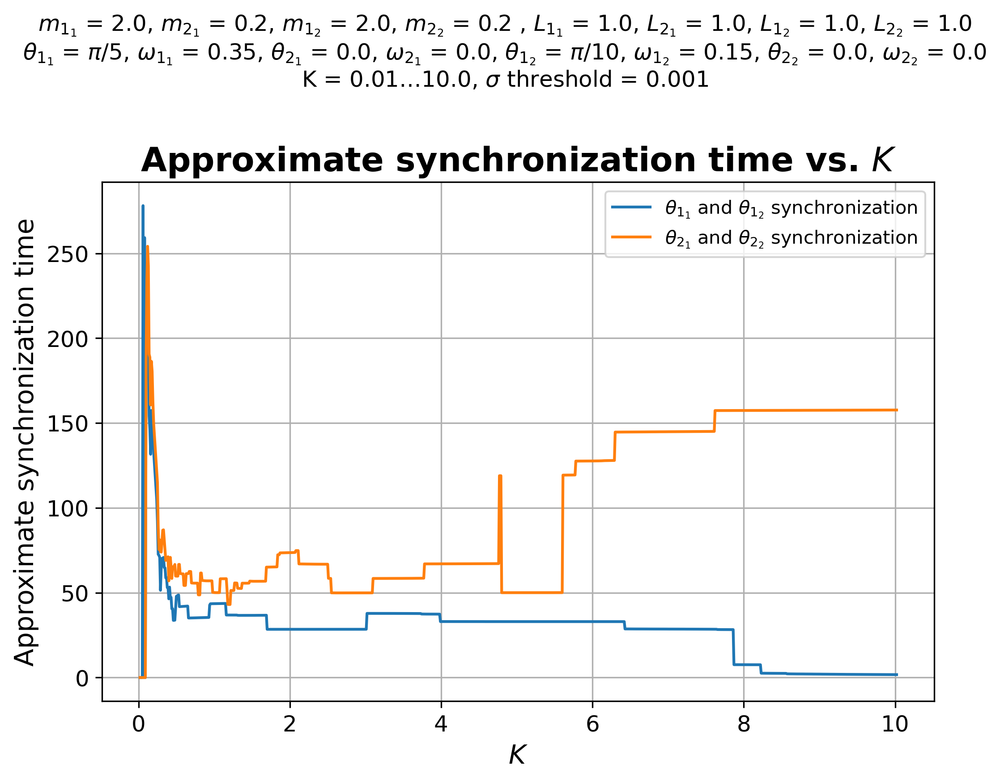

In [66]:
plt.figure(figsize=(4*figsize, 3*figsize), dpi=dpi)
plt.plot(
    x_axis_K,
    first_storage,
    label=r"$\theta_{1_1}$ and $\theta_{1_2}$ synchronization",
)

print(first_storage)

plt.plot(
    x_axis_K,
    second_storage,
    label=r"$\theta_{2_1}$ and $\theta_{2_2}$ synchronization",
)
plt.title(
    r"Approximate synchronization time vs. $K$", fontsize=18, fontweight="bold"
)
plt.suptitle(
    r"$m_{1_1}$"
    + " = "
    + rf"{m1_1}"
    + ", "
    + r"$m_{2_1}$"
    + " = "
    + f"{m2_1}"
    + ", "
    + r"$m_{1_2}$"
    + " = "
    + f"{m1_2}"
    + ", "
    + r"$m_{2_2}$"
    + " = "
    + f"{m2_2} "
    + ", "
    + r"$L_{1_1}$"
    + " = "
    + f"{L1_1}"
    + ", "
    + r"$L_{2_1}$"
    + " = "
    + f"{L2_1}"
    + ", "
    + r"$L_{1_2}$"
    + " = "
    + f"{L1_2}"
    + ", "
    + r"$L_{2_2}$"
    + " = "
    + f"{L2_2}"
    + "\n"
    + r"$\theta_{1_1}$"
    + " = "
    + f"{z0_str[0]}"
    + ", "
    + r"$\omega_{1_1}$"
    + " = "
    + f"{z0_str[1]}"
    + ", "
    + r"$\theta_{2_1}$"
    + " = "
    + f"{z0_str[2]}"
    + ", "
    + r"$\omega_{2_1}$"
    + " = "
    + f"{z0_str[3]}"
    + ", "
    + r"$\theta_{1_2}$"
    + " = "
    + f"{z0_str[4]}"
    + ", "
    + r"$\omega_{1_2}$"
    + " = "
    + f"{z0_str[5]}"
    + ", "
    + r"$\theta_{2_2}$"
    + " = "
    + f"{z0_str[6]}"
    + ", "
    + r"$\omega_{2_2}$"
    + " = "
    + f"{z0_str[7]}"
    + "\n"
    + r"K"
    + " = "
    + rf"0.01$\dots$10.0"
    + ", "
    + r"$\sigma$ threshold"
    + " = "
    + f"{standard_deviation_threshold}",
)
plt.xlabel(r"$K$", fontsize=14)
plt.ylabel("Approximate synchronization time", fontsize=14)
plt.subplots_adjust(top=0.77)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.rc("font")
plt.legend(prop={"size": 10})
plt.grid(linestyle="-")
plt.savefig("plots/double-pendulum-synchronization-time_K.pdf", dpi=300)
plt.show()